<a href="https://colab.research.google.com/github/Alaa-Sherif/Head-Pose-Estimation/blob/main/ML1_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ML1 Final Project (Head Pose Estimation)

## Instructions

**Inputs:** Image

**Outputs:** Yaw, Pitch, Roll

**To be delivered:** a document (already run) colab notrbook on github + a short video of the running algo on yourself

You can use mediapipe to get the face points

You can use AFLW2000 dataset

You will find a way to get the angles from the dataset

Guide:
[https://github.com/s7s/machine_learning_1/blob/master/ML_in_practice/ProjectHelper.ipynb](https://github.com/s7s/machine_learning_1/blob/master/ML_in_practice/ProjectHelper.ipynb)



## Team


*   [Ishraq Ahmed Jamaluddin](https://www.linkedin.com/in/ishraqahmedjamaluddin) - intake 43 - smart village branch
*   [Alaa Ali Hassan Sherif](https://www.linkedin.com/in/alaa-sherif) - intake 43 - smart village branch

### Installing MediaPipe

In [3]:
%%capture
!pip install mediapipe

### Required Libraries
& defined functions

In [4]:
import numpy as np
import os,cv2,math,glob,random
import scipy.io as sio
from math import cos, sin
from pathlib import Path
import pandas as pd
import mediapipe
import warnings
warnings.filterwarnings('ignore')
from google.colab.patches import cv2_imshow

In [33]:
def draw_axis(img, pitch, yaw, roll, tdx=None, tdy=None, size = 100):

    yaw = -yaw
    if tdx != None and tdy != None:
        tdx = tdx
        tdy = tdy
    else:
        height, width = img.shape[:2]
        tdx = width / 2
        tdy = height / 2

    # X-Axis pointing to right. drawn in red
    x1 = size * (cos(yaw) * cos(roll)) + tdx
    y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy

    # Y-Axis | drawn in green
    #        v
    x2 = size * (-cos(yaw) * sin(roll)) + tdx
    y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy

    # Z-Axis (out of the screen) drawn in blue
    x3 = size * (sin(yaw)) + tdx
    y3 = size * (-cos(yaw) * sin(pitch)) + tdy

    cv2.line(img, (int(tdx), int(tdy)), (int(x1),int(y1)),(0,0,255),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x2),int(y2)),(0,255,0),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x3),int(y3)),(255,0,0),2)

    return img

### Downloading Data [previous]
just to extract the keypoints and save it into a DataFrame

In [ ]:
# !wget 'http://www.cbsr.ia.ac.cn/users/xiangyuzhu/projects/3DDFA/Database/AFLW2000-3D.zip'   # downloading the data zip file

In [ ]:
# !unzip /content/AFLW2000-3D.zip

### Preparing Data [previous]
just to extract the keypoints and save it into a DataFrame

In [ ]:
# # choosing random image
# random_file = 'image04304'

# faceModule = mediapipe.solutions.face_mesh
# # loading image and its correspinding mat file
# with faceModule.FaceMesh(static_image_mode=True) as faces:
#     # loading the image
#     image = cv2.imread('/content/AFLW2000/'+random_file+'.jpg')
#     # processing the face to extract the landmark points (468 point) for each x,y,z
#     results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
#     if results.multi_face_landmarks != None: 
#       # looping over the faces in the image
#       for face in results.multi_face_landmarks:
#           for landmark in face.landmark:
#               x = landmark.x
#               y = landmark.y
#               # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image
#               shape = image.shape 
#               relative_x = int(x * shape[1])
#               relative_y = int(y * shape[0])
#               # cv2.putText(image, str(relative_y), (int(relative_x),int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
#               cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 255, 0), thickness=2)
#       cv2_imshow(image)

In [ ]:
# image = cv2.imread('/content/AFLW2000/'+random_file+'.jpg')
# # loading the mat file to extract the 3 angels of the face (pitch,yaw,roll)
# mat_file = sio.loadmat('/content/AFLW2000/'+random_file+'.mat')
# # extracting the labels 3 angels
# pose_para = mat_file["Pose_Para"][0][:3]
# pitch = pose_para[0]
# yaw = pose_para[1]
# roll = pose_para[2]
# cv2_imshow(draw_axis(image,pitch,yaw,roll))

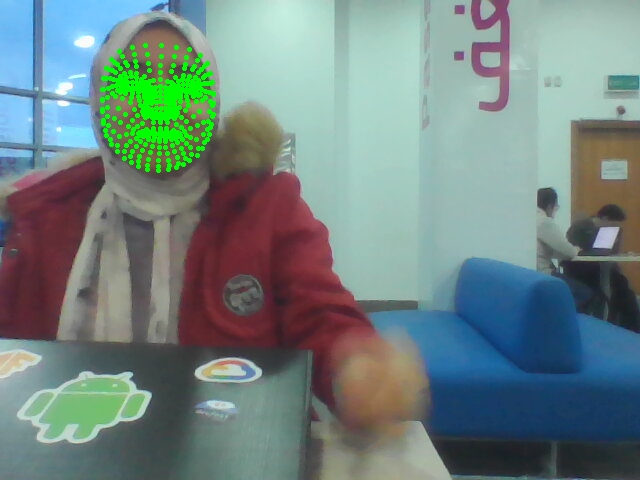

In [ ]:
# choosing random image
random_file = 'loulou'

faceModule = mediapipe.solutions.face_mesh
# loading image and its correspinding mat file
with faceModule.FaceMesh(static_image_mode=True) as faces:
    # loading the image
    image = cv2.imread('/content/'+random_file+'.jpg')
    # processing the face to extract the landmark points (468 point) for each x,y,z
    results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if results.multi_face_landmarks != None: 
      # looping over the faces in the image
      for face in results.multi_face_landmarks:
          for landmark in face.landmark:
              x = landmark.x
              y = landmark.y
              # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image
              shape = image.shape 
              relative_x = int(x * shape[1])
              relative_y = int(y * shape[0])
              # cv2.putText(image, str(relative_y), (int(relative_x),int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
              cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 255, 0), thickness=2)
      cv2_imshow(image)

In [ ]:
print(len(results.multi_face_landmarks))
print(len(results.multi_face_landmarks[0].landmark))

1
468


In [ ]:
results.multi_face_landmarks[0].landmark[0]

x: 0.2504599392414093
y: 0.2686101794242859
z: -0.025997886434197426

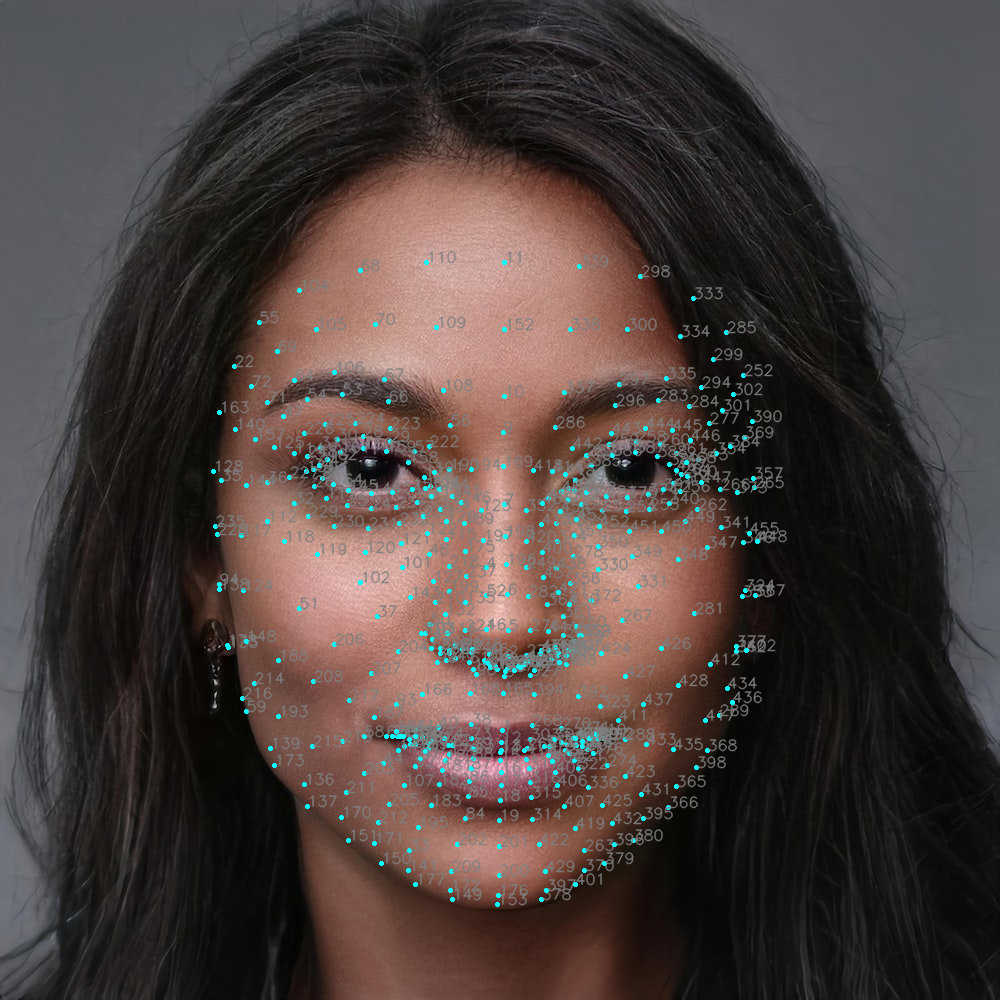

In [ ]:
# choosing random image
random_file = 'trial'

faceModule = mediapipe.solutions.face_mesh
# loading image and its correspinding mat file
with faceModule.FaceMesh(static_image_mode=True) as faces:
    # loading the image
    image = cv2.imread('/content/'+random_file+'.jpeg')
    # processing the face to extract the landmark points (468 point) for each x,y,z
    results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if results.multi_face_landmarks != None: 
      # looping over the faces in the image
      for face in results.multi_face_landmarks:
          i = 1
          for landmark in face.landmark:
              x = landmark.x
              y = landmark.y
              # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image
              shape = image.shape 
              relative_x = int(x * shape[1])
              relative_y = int(y * shape[0])
              # cv2.putText(image, str(relative_y), (int(relative_x),int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
              cv2.circle(image, (relative_x, relative_y), radius=1, color=(255, 255, 0), thickness=2)
              font = cv2.FONT_HERSHEY_SIMPLEX
        
              # org
              org = (relative_x, relative_y)
              
              # fontScale
              fontScale = .5
             
              # Blue color in BGR
              color = (127, 127, 127)
              
              # Line thickness of 2 px
              thickness = 1
              
              # Using cv2.putText() method
            #   if i >= 350 and i < 400: # 468
              image = cv2.putText(image, str(i), org, font, 
                                  fontScale, color, thickness, cv2.LINE_AA)
              i += 1

      cv2_imshow(image)

In [ ]:
print(len(results.multi_face_landmarks))
print(len(results.multi_face_landmarks[0].landmark))

1
468


In [ ]:
results.multi_face_landmarks[0].landmark[0]

x: 0.50239497423172
y: 0.7307323217391968
z: -0.05136491730809212

In [ ]:
# def load_images_from_folder(folder):
#     images = []
#     for filename in os.listdir(folder):
#         img = cv2.imread(os.path.join(folder,filename))
#         if img is not None and filename.endswith('.jpg'):

#             print(filename[:-4])
#             images.append(filename[:-4])

#     return images

In [ ]:
# filenames = load_images_from_folder('/content/AFLW2000')

In [ ]:
# filenames

In [ ]:
# len(filenames)

In [ ]:
# dflst = []
# for filename in filenames:
#     lms = []

#     faceModule = mediapipe.solutions.face_mesh
#     # loading image and its correspinding mat file
#     with faceModule.FaceMesh(static_image_mode=True) as faces:
#         # loading the image
#         image = cv2.imread('/content/AFLW2000/'+filename+'.jpg')
#         # processing the face to extract the landmark points (468 point) for each x,y,z
#         results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
#         if results.multi_face_landmarks != None: 
#             # looping over the faces in the image
#             face = results.multi_face_landmarks[0]
#             for landmark in face.landmark:
#                 x = landmark.x
#                 y = landmark.y
#                 lms.append(x)
#                 lms.append(y)


#             mat_file = sio.loadmat('/content/AFLW2000/'+filename+'.mat')
#             pose_para = mat_file["Pose_Para"][0][:3]
#             pitch = pose_para[0]
#             yaw = pose_para[1]
#             roll = pose_para[2]

#             lms.append(pitch)
#             lms.append(yaw)
#             lms.append(roll)

#             dflst.append(np.array(lms).reshape(-1))
        

# dflst = np.array(dflst)
# dflst

In [ ]:
# dflst.shape # (1853, 939)

In [ ]:
# df = pd.DataFrame(dflst)
# df

In [ ]:
# df.to_csv('hi.csv')

## Reading saved data

In [5]:
df = pd.read_csv('landmarks_and_labels.csv').drop(['Unnamed: 0'], axis=1)
df

,0,1,2,3,4,5,6,7,8,9,...,929,930,931,932,933,934,935,936,937,938
0,0.537275,0.658462,0.562258,0.616171,0.538312,0.626584,0.538255,0.563986,0.564414,0.601224,...,0.513421,0.534031,0.518465,0.569160,0.491356,0.572825,0.485177,-0.304961,-0.819743,0.037171
1,0.462494,0.680938,0.491776,0.641798,0.478581,0.642810,0.493573,0.567673,0.499129,0.626902,...,0.504628,0.554047,0.512304,0.664141,0.509327,0.677589,0.499090,-0.544066,0.003593,0.362706
2,0.586061,0.657358,0.606206,0.596979,0.578596,0.617263,0.575345,0.548370,0.607375,0.581206,...,0.509160,0.565666,0.512802,0.601090,0.496816,0.602998,0.490111,0.208705,-1.244902,-0.247792
3,0.519647,0.686766,0.475971,0.641352,0.501510,0.646663,0.447840,0.579149,0.466064,0.625290,...,0.497420,0.489277,0.506227,0.587744,0.440048,0.595030,0.429177,-0.391323,0.342428,-0.483296
4,0.496700,0.653161,0.474206,0.611557,0.488492,0.623231,0.463256,0.551305,0.471166,0.594077,...,0.498273,0.513946,0.502863,0.613553,0.474189,0.622524,0.465971,-0.280356,0.295803,-0.133340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.499466,0.667396,0.466790,0.626236,0.488597,0.633827,0.455611,0.571798,0.461575,0.611669,...,0.515872,0.504050,0.521277,0.598319,0.486946,0.606665,0.478002,-0.336188,0.469889,-0.241364
1849,0.444759,0.669101,0.410226,0.620772,0.447277,0.636342,0.424091,0.570538,0.406255,0.605433,...,0.529542,0.492845,0.533970,0.586409,0.521022,0.598639,0.510045,-0.150835,1.042128,-0.168291
1850,0.488821,0.652489,0.476302,0.609928,0.487541,0.627442,0.473504,0.576676,0.475707,0.597518,...,0.561338,0.519838,0.562199,0.595392,0.561700,0.605114,0.553341,-0.048739,0.244146,-0.022754
1851,0.532379,0.618214,0.550867,0.561791,0.534962,0.585679,0.527670,0.517174,0.552143,0.545214,...,0.501065,0.544355,0.500774,0.611818,0.501750,0.619399,0.495284,0.188942,-0.461788,-0.027678


In [6]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,929,930,931,932,933,934,935,936,937,938
count,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,...,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000,1853.000000
mean,0.505036,0.666149,0.503698,0.611075,0.504510,0.627596,0.490213,0.550968,0.503416,0.592989,...,0.503258,0.530948,0.507431,0.621081,0.485716,0.629547,0.478221,-0.095366,0.013611,-0.033167
std,0.041261,0.028346,0.053271,0.029041,0.037840,0.024675,0.044587,0.023908,0.054824,0.028645,...,0.023010,0.033922,0.022426,0.047496,0.038984,0.050135,0.041212,0.549292,0.580266,0.649282
min,0.256906,0.179093,0.227159,0.144636,0.249772,0.152404,0.222207,0.100594,0.223030,0.131856,...,0.055864,0.266672,0.060640,0.304541,0.032022,0.294275,0.024076,-12.457202,-6.130066,-16.969362
25%,0.482141,0.652247,0.469521,0.598221,0.481937,0.617026,0.460069,0.540801,0.466724,0.580285,...,0.491350,0.514206,0.496217,0.593103,0.463229,0.601160,0.454632,-0.246453,-0.256714,-0.160274
50%,0.505162,0.668768,0.501536,0.614621,0.503587,0.629840,0.485371,0.552197,0.501211,0.596475,...,0.502106,0.532342,0.506317,0.626023,0.485355,0.635011,0.477745,-0.123371,0.019403,-0.017463
75%,0.526248,0.682794,0.537543,0.627792,0.525717,0.641242,0.516599,0.562998,0.538674,0.609476,...,0.513950,0.546662,0.517966,0.650143,0.506548,0.660787,0.499799,0.028133,0.305791,0.126460
max,0.928491,0.799190,0.929157,0.776498,0.923774,0.782066,0.901552,0.745973,0.926027,0.767816,...,0.720868,0.908686,0.723342,0.990572,0.741343,0.998658,0.750775,15.598820,3.277500,2.166107


In [7]:
df8 = df['8'].copy()
df9 = df['9'].copy()

In [8]:
# centering around the nose
for col in df.columns.astype('int')[:-3]:
    if col % 2 == 0: # x coord
        df[str(col)] = df[str(col)] - df8
    else:
        df[str(col)] = df[str(col)] - df9
df

,0,1,2,3,4,5,6,7,8,9,...,929,930,931,932,933,934,935,936,937,938
0,-0.027139,0.057238,-0.002155,0.014947,-0.026102,0.025360,-0.026159,-0.037238,0.0,0.0,...,-0.087803,-0.030383,-0.082759,0.004746,-0.109868,0.008411,-0.116048,-0.304961,-0.819743,0.037171
1,-0.036635,0.054036,-0.007353,0.014895,-0.020548,0.015908,-0.005556,-0.059230,0.0,0.0,...,-0.122275,0.054918,-0.114599,0.165013,-0.117575,0.178460,-0.127812,-0.544066,0.003593,0.362706
2,-0.021314,0.076152,-0.001169,0.015774,-0.028779,0.036057,-0.032030,-0.032835,0.0,0.0,...,-0.072045,-0.041709,-0.068404,-0.006285,-0.084389,-0.004377,-0.091095,0.208705,-1.244902,-0.247792
3,0.053583,0.061476,0.009907,0.016061,0.035446,0.021373,-0.018224,-0.046141,0.0,0.0,...,-0.127870,0.023213,-0.119063,0.121680,-0.185242,0.128966,-0.196113,-0.391323,0.342428,-0.483296
4,0.025534,0.059084,0.003040,0.017480,0.017327,0.029154,-0.007910,-0.042772,0.0,0.0,...,-0.095804,0.042781,-0.091214,0.142387,-0.119888,0.151358,-0.128105,-0.280356,0.295803,-0.133340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.037891,0.055726,0.005215,0.014567,0.027021,0.022158,-0.005965,-0.039872,0.0,0.0,...,-0.095798,0.042475,-0.090392,0.136744,-0.124723,0.145089,-0.133667,-0.336188,0.469889,-0.241364
1849,0.038504,0.063667,0.003971,0.015338,0.041022,0.030909,0.017836,-0.034896,0.0,0.0,...,-0.075892,0.086590,-0.071464,0.180154,-0.084411,0.192385,-0.095388,-0.150835,1.042128,-0.168291
1850,0.013114,0.054972,0.000595,0.012411,0.011835,0.029924,-0.002202,-0.020841,0.0,0.0,...,-0.036180,0.044131,-0.035318,0.119685,-0.035818,0.129407,-0.044177,-0.048739,0.244146,-0.022754
1851,-0.019765,0.073000,-0.001276,0.016577,-0.017181,0.040465,-0.024473,-0.028041,0.0,0.0,...,-0.044150,-0.007789,-0.044440,0.059675,-0.043465,0.067256,-0.049931,0.188942,-0.461788,-0.027678


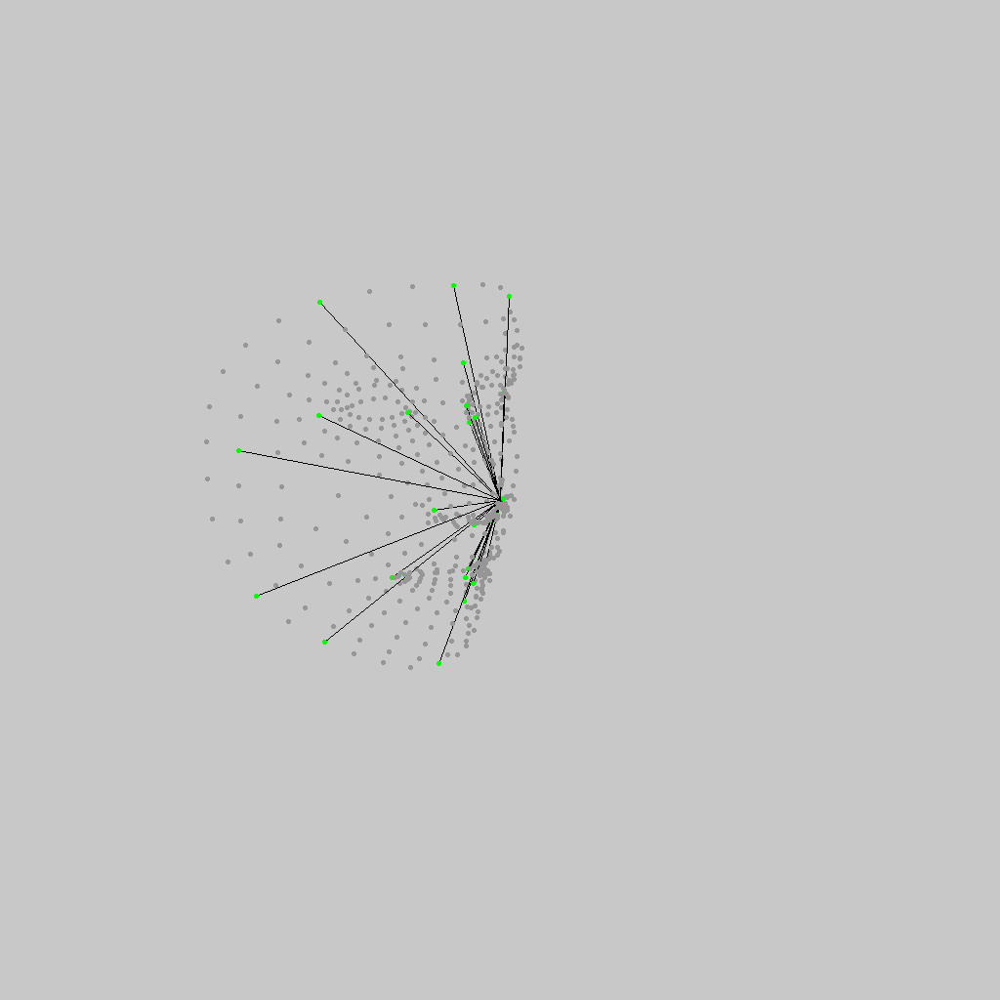

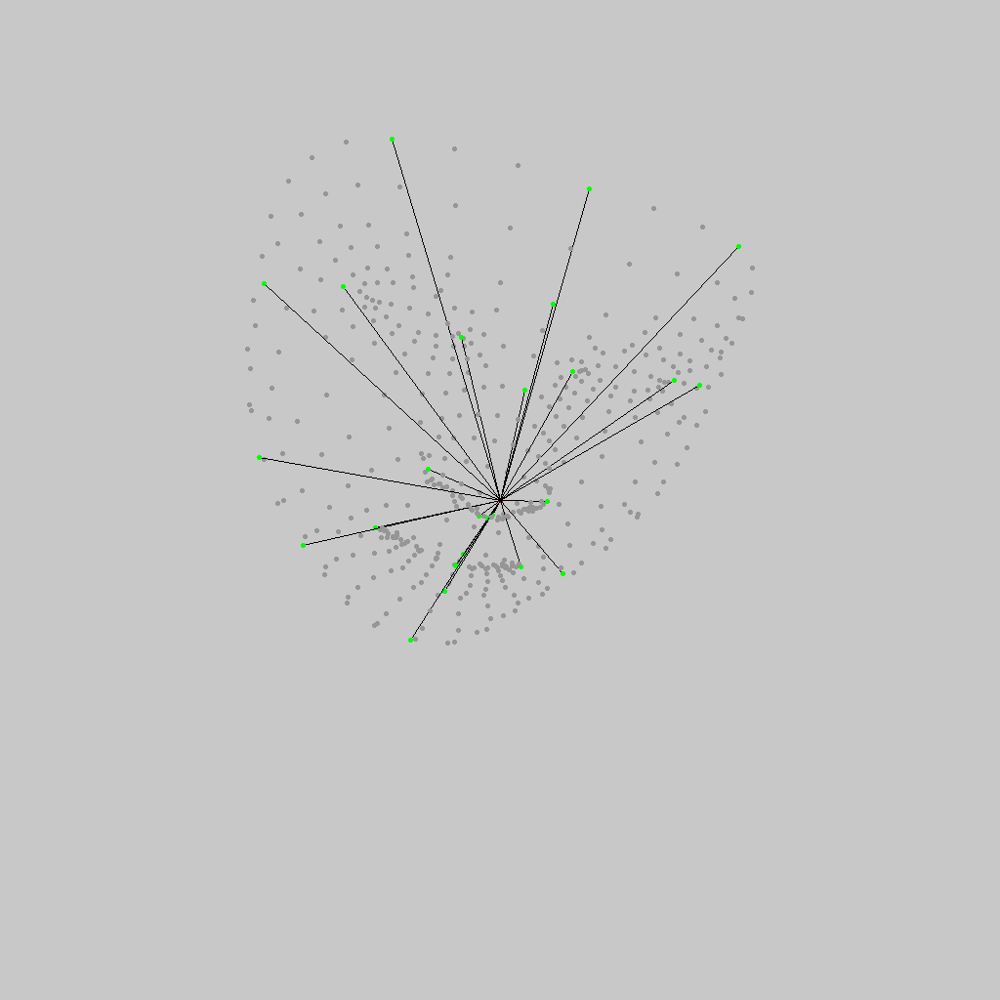

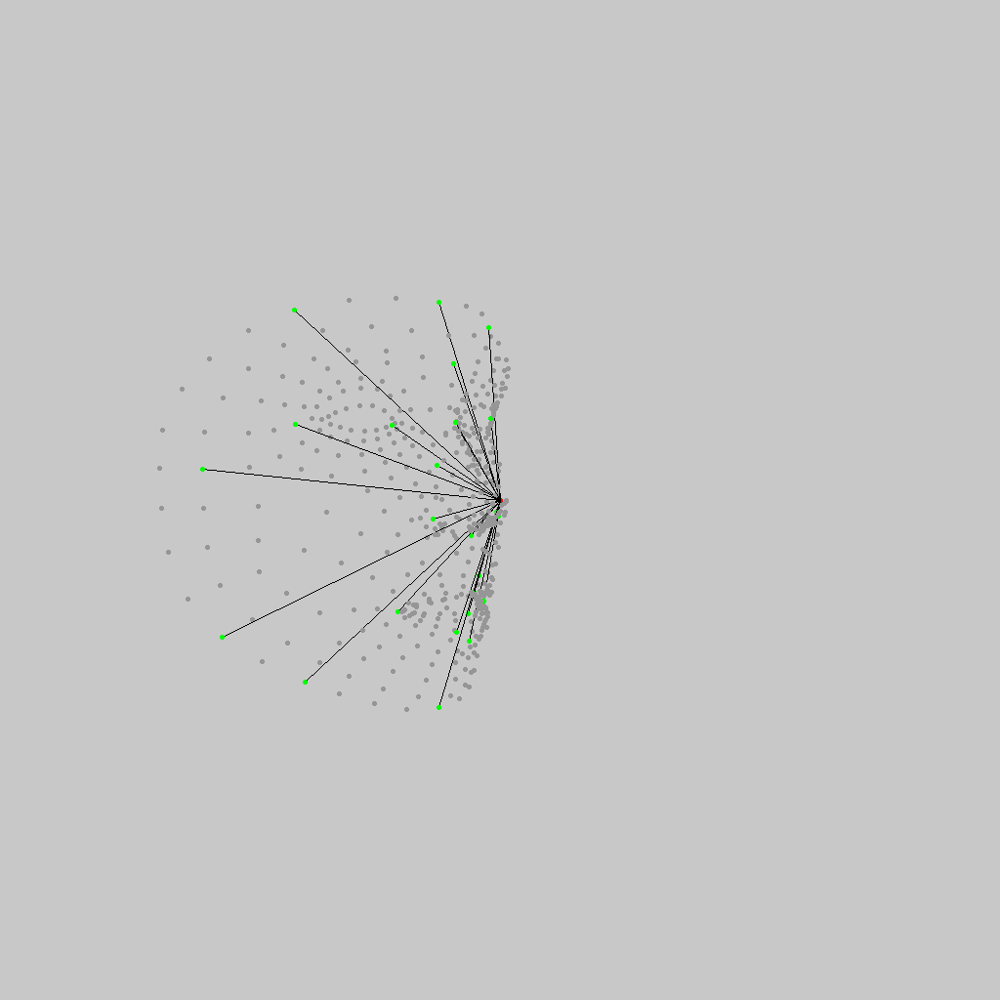

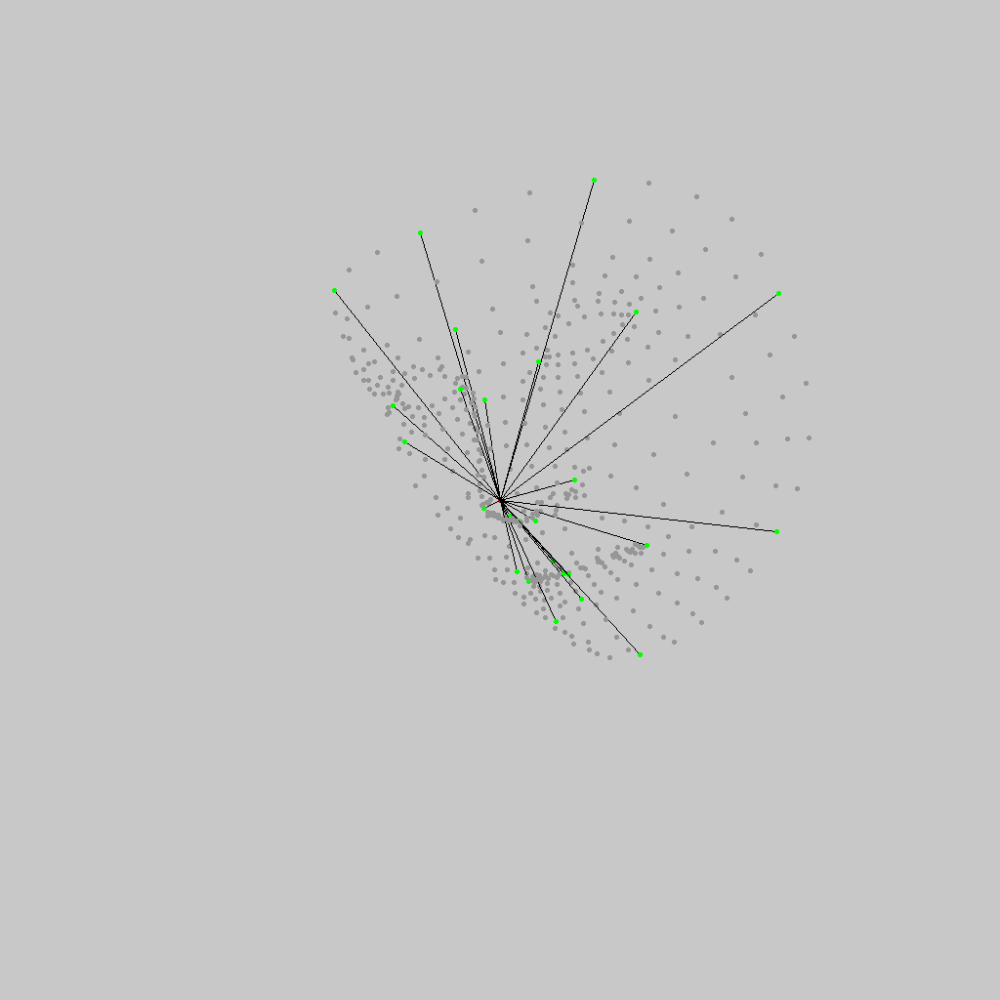

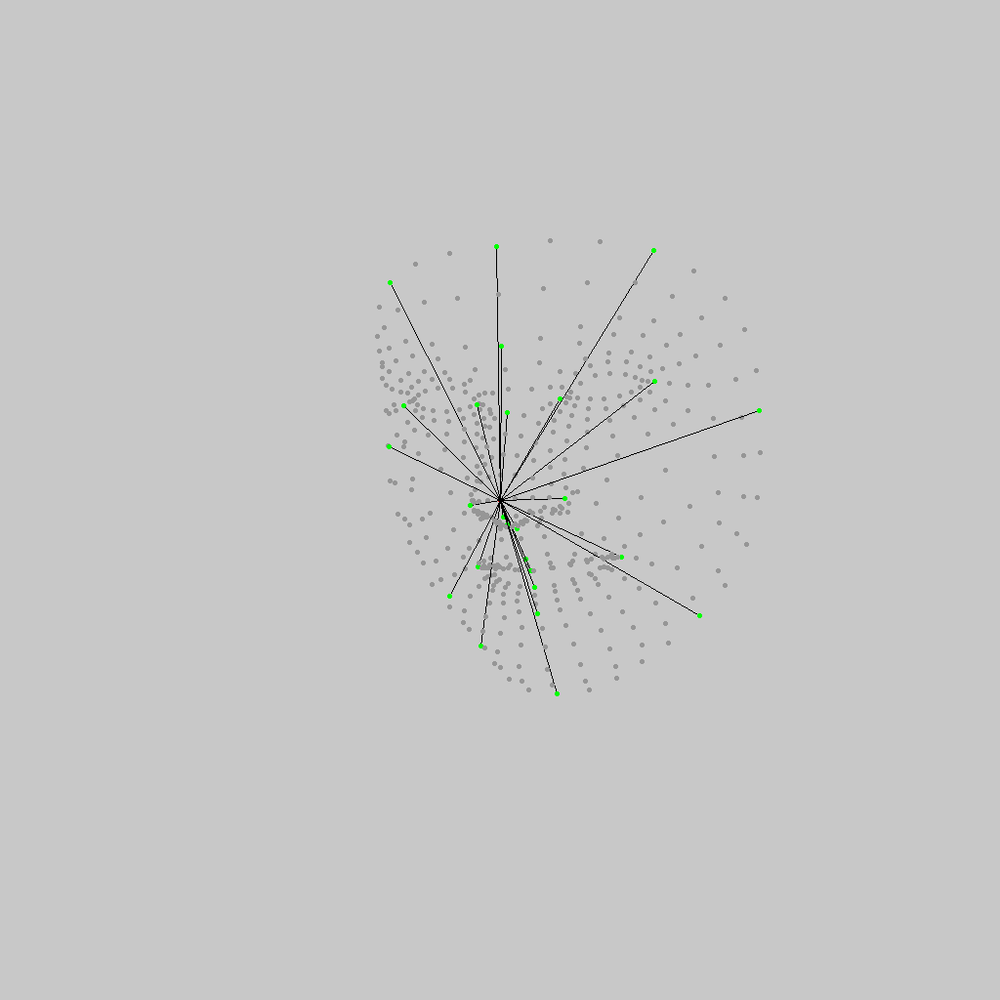

...

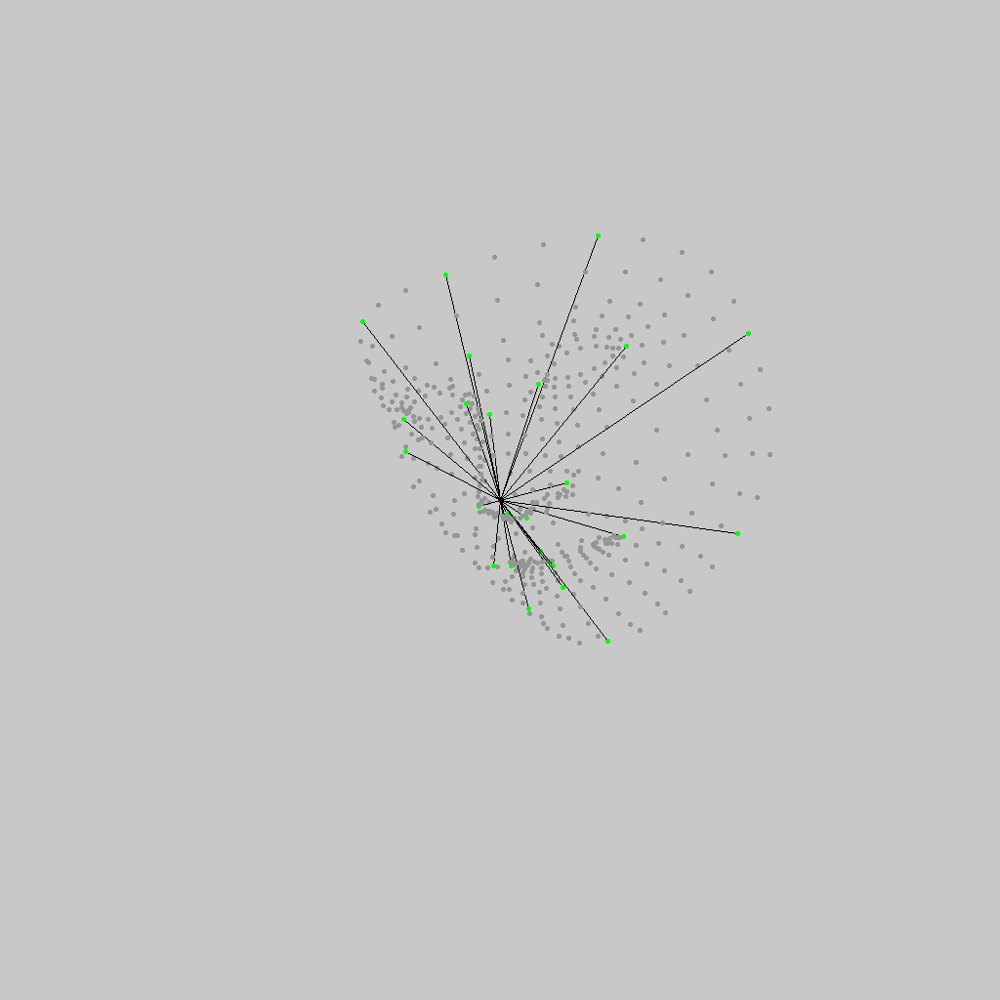

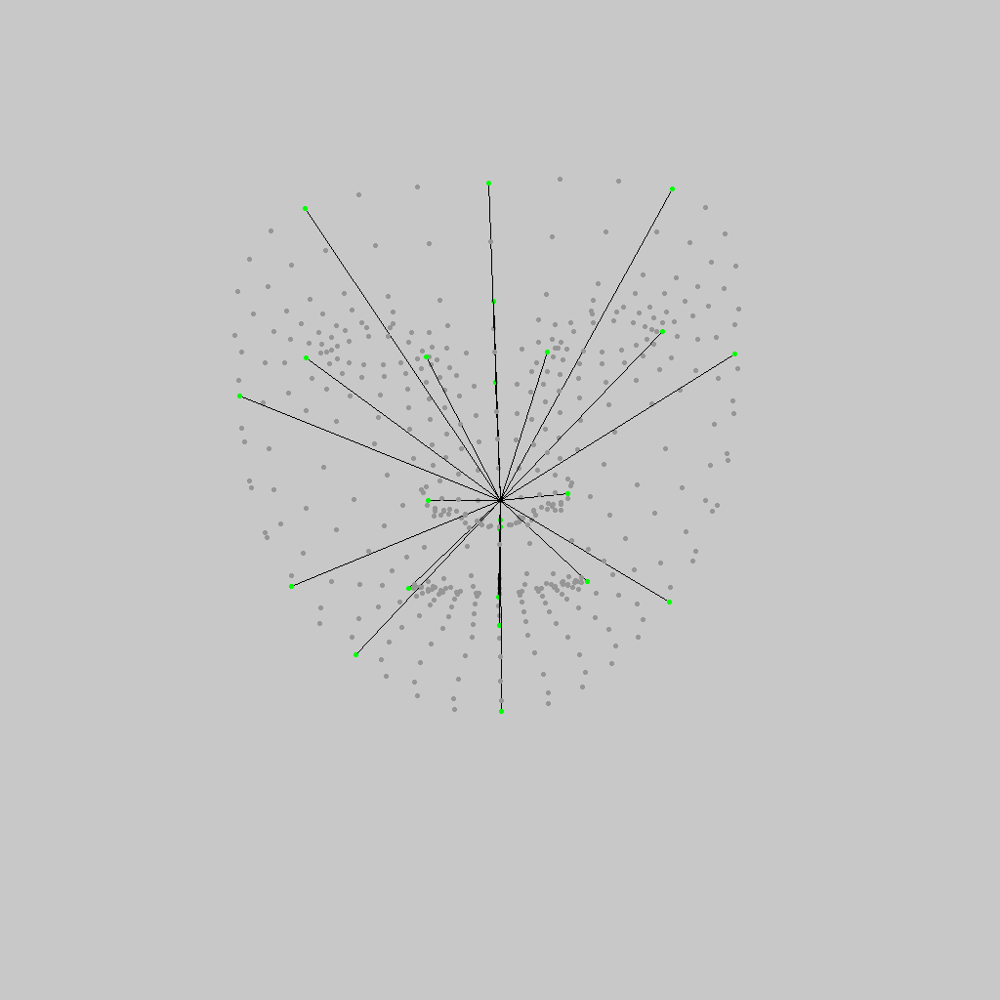

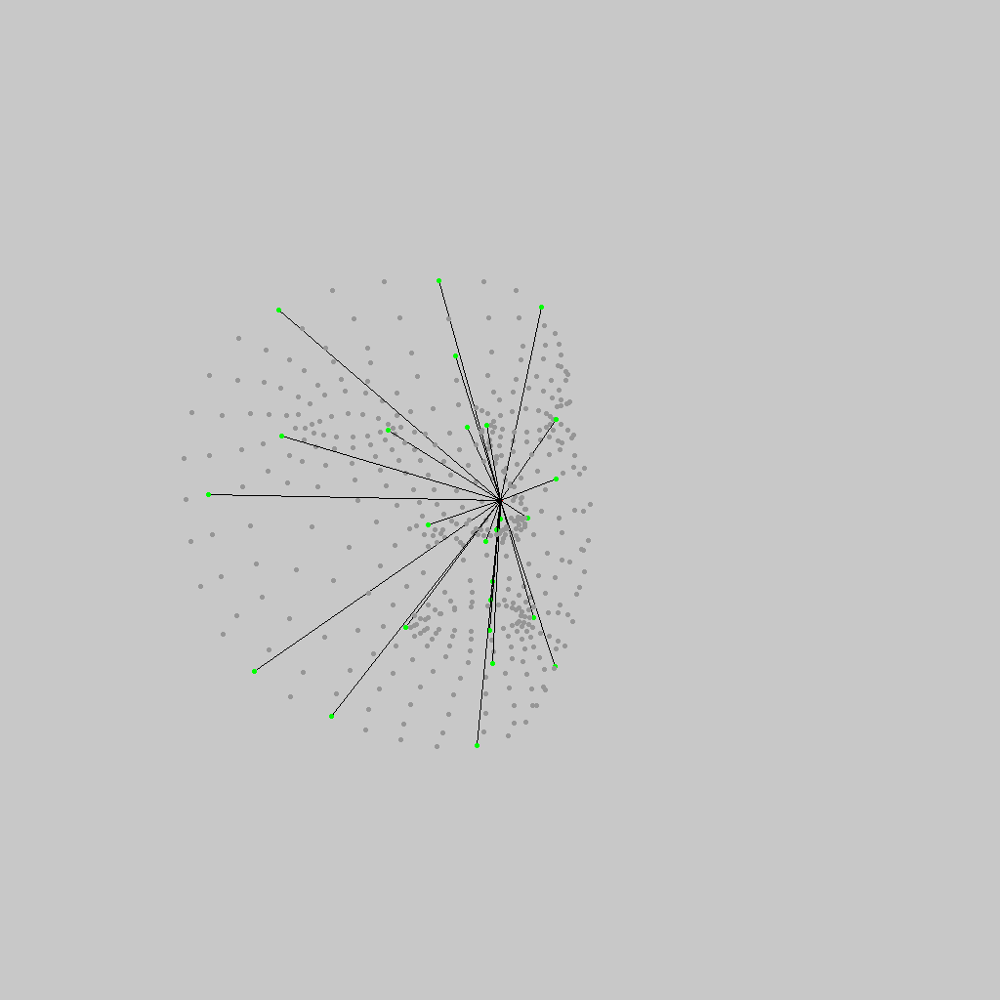

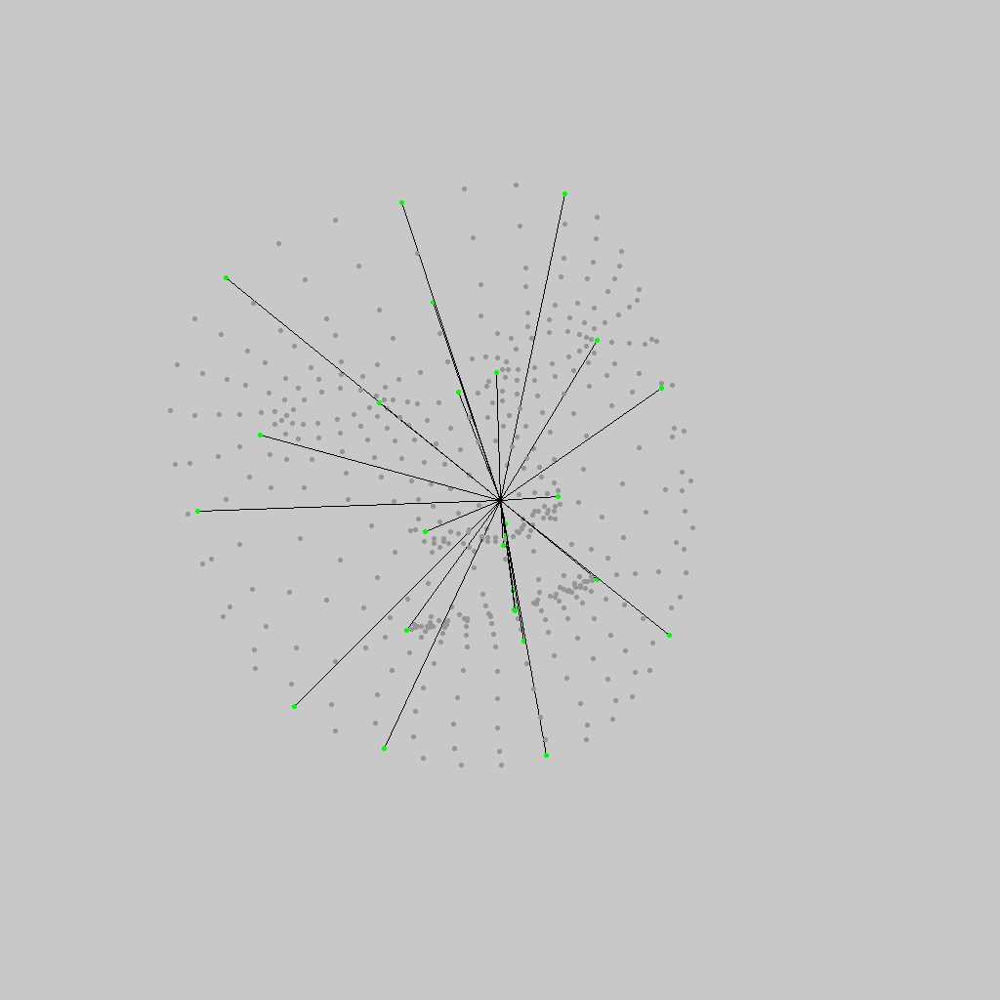

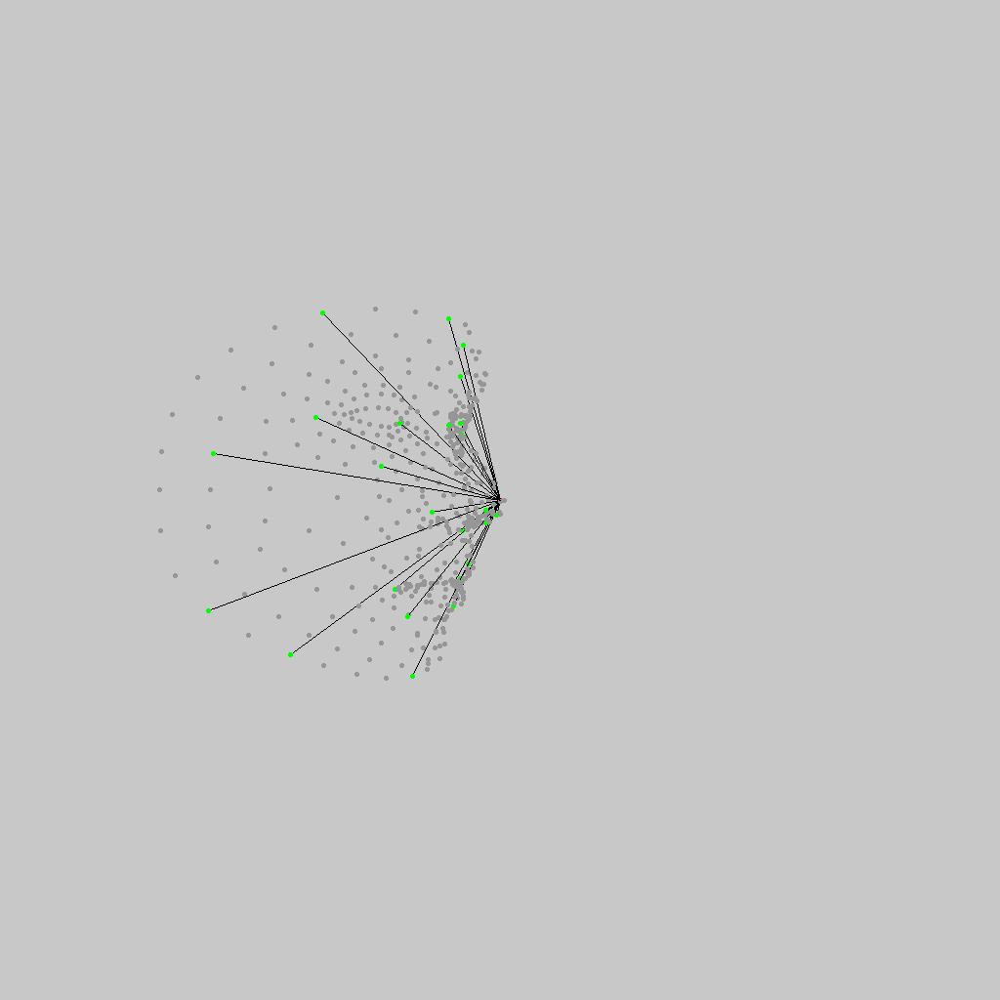

In [9]:
toKeep = np.array([11, 10, 7, 2, 20, 3, 49, 279, 1, 13, 15, 18, 62, 292, 633, 151, 153, 455, 228, 156, 227, 464, 360, 333, 104, 366, 173])-1
# toKeep = np.arange(0, 468, 1)

for j in range(20):
    lst = []
    for i in df.iloc[j][:-3].index.astype('int'):
        if i % 2 == 0:
            x = df.iloc[j][:-3][i]
        else:
            y = df.iloc[j][:-3][i]
            lst.append([x, y])


    image = np.zeros([1024,1024,3],dtype=np.uint8)
    image.fill(200)

    i = 0

    for landmark in lst:
        x = landmark[0] + .5
        y = landmark[1] + .5
        # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image
        shape = image.shape 
        relative_x = int(x * shape[1])
        relative_y = int(y * shape[0])
        # cv2.putText(image, str(relative_y), (int(relative_x),int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
        if i == 4:
            cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 0, 255), thickness=2)
        elif i in toKeep:
            cv2.line(image, (relative_x, relative_y), (int(.5* shape[1]), int(.5*shape[0])), color=(0, 0, 0), thickness=1)
            cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 255, 0), thickness=2)
        else:
            cv2.circle(image, (relative_x, relative_y), radius=1, color=(150, 150, 150), thickness=2)
        i += 1
    cv2_imshow(image)

In [10]:
numsToKeep = list(np.append(toKeep*2, toKeep*2+1)) + [8, 9]

In [11]:
df.iloc[:, :-3]

,0,1,2,3,4,5,6,7,8,9,...,926,927,928,929,930,931,932,933,934,935
0,-0.027139,0.057238,-0.002155,0.014947,-0.026102,0.025360,-0.026159,-0.037238,0.0,0.0,...,-0.033313,-0.094090,-0.033891,-0.087803,-0.030383,-0.082759,0.004746,-0.109868,0.008411,-0.116048
1,-0.036635,0.054036,-0.007353,0.014895,-0.020548,0.015908,-0.005556,-0.059230,0.0,0.0,...,0.072554,-0.128088,0.061215,-0.122275,0.054918,-0.114599,0.165013,-0.117575,0.178460,-0.127812
2,-0.021314,0.076152,-0.001169,0.015774,-0.028779,0.036057,-0.032030,-0.032835,0.0,0.0,...,-0.044859,-0.077344,-0.045733,-0.072045,-0.041709,-0.068404,-0.006285,-0.084389,-0.004377,-0.091095
3,0.053583,0.061476,0.009907,0.016061,0.035446,0.021373,-0.018224,-0.046141,0.0,0.0,...,0.038455,-0.138201,0.029784,-0.127870,0.023213,-0.119063,0.121680,-0.185242,0.128966,-0.196113
4,0.025534,0.059084,0.003040,0.017480,0.017327,0.029154,-0.007910,-0.042772,0.0,0.0,...,0.060033,-0.100855,0.050049,-0.095804,0.042781,-0.091214,0.142387,-0.119888,0.151358,-0.128105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.037891,0.055726,0.005215,0.014567,0.027021,0.022158,-0.005965,-0.039872,0.0,0.0,...,0.059295,-0.101786,0.049948,-0.095798,0.042475,-0.090392,0.136744,-0.124723,0.145089,-0.133667
1849,0.038504,0.063667,0.003971,0.015338,0.041022,0.030909,0.017836,-0.034896,0.0,0.0,...,0.110367,-0.081398,0.098457,-0.075892,0.086590,-0.071464,0.180154,-0.084411,0.192385,-0.095388
1850,0.013114,0.054972,0.000595,0.012411,0.011835,0.029924,-0.002202,-0.020841,0.0,0.0,...,0.060209,-0.038405,0.050953,-0.036180,0.044131,-0.035318,0.119685,-0.035818,0.129407,-0.044177
1851,-0.019765,0.073000,-0.001276,0.016577,-0.017181,0.040465,-0.024473,-0.028041,0.0,0.0,...,-0.002867,-0.045388,-0.007540,-0.044150,-0.007789,-0.044440,0.059675,-0.043465,0.067256,-0.049931


In [12]:
# getting the angle from all the points to the nose
for col in df.columns.astype('int')[:-3]:
    if col in numsToKeep:
        if col % 2 != 0:
            df[str(col-1) + ' ' + str(col) + ' angle'] = np.arctan(df[str(col-1)] / df[str(col)]) / (np.pi/2)
            df[str(col-1) + ' ' + str(col) + ' dist'] = df[str(col-1)].abs() / df[str(col)].abs()

df

,0,1,2,3,4,5,6,7,8,9,...,664 665 angle,664 665 dist,718 719 angle,718 719 dist,730 731 angle,730 731 dist,908 909 angle,908 909 dist,926 927 angle,926 927 dist
0,-0.027139,0.057238,-0.002155,0.014947,-0.026102,0.025360,-0.026159,-0.037238,0.0,0.0,...,-0.030428,0.047833,-0.028170,0.044279,-0.194987,0.316237,0.189437,0.306673,0.216628,0.354050
1,-0.036635,0.054036,-0.007353,0.014895,-0.020548,0.015908,-0.005556,-0.059230,0.0,0.0,...,-0.481360,0.943092,-0.616579,1.454577,0.448148,0.849063,-0.667146,1.735066,-0.328097,0.566435
2,-0.021314,0.076152,-0.001169,0.015774,-0.028779,0.036057,-0.032030,-0.032835,0.0,0.0,...,0.042795,0.067324,0.070433,0.111089,-0.203088,0.330292,0.674597,1.782978,0.334592,0.579990
3,0.053583,0.061476,0.009907,0.016061,0.035446,0.021373,-0.018224,-0.046141,0.0,0.0,...,-0.182117,0.294137,-0.400648,0.728100,0.927311,8.720058,-0.594555,1.351913,-0.172773,0.278257
4,0.025534,0.059084,0.003040,0.017480,0.017327,0.029154,-0.007910,-0.042772,0.0,0.0,...,-0.351421,0.615876,-0.583856,1.305443,0.665345,1.723776,-0.789250,2.909565,-0.341809,0.595241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.037891,0.055726,0.005215,0.014567,0.027021,0.022158,-0.005965,-0.039872,0.0,0.0,...,-0.326386,0.562891,-0.556815,1.196554,0.799998,3.077650,-0.735086,2.262780,-0.335809,0.582547
1849,0.038504,0.063667,0.003971,0.015338,0.041022,0.030909,0.017836,-0.034896,0.0,0.0,...,-0.507159,1.022748,-0.741355,2.324430,0.689102,1.882246,-0.920750,7.991473,-0.595449,1.355893
1850,0.013114,0.054972,0.000595,0.012411,0.011835,0.029924,-0.002202,-0.020841,0.0,0.0,...,-0.562834,1.219808,-0.831851,3.697588,0.504030,1.012741,0.949536,12.588800,-0.638528,1.567725
1851,-0.019765,0.073000,-0.001276,0.016577,-0.017181,0.040465,-0.024473,-0.028041,0.0,0.0,...,-0.281908,0.474229,-0.663735,1.713774,0.134056,0.213743,0.692759,1.908628,0.040157,0.063163


In [13]:
df.drop([str(col) for col in range(936)] + ['8 9 angle', '8 9 dist'], axis=1, inplace=True)
df

,936,937,938,0 1 angle,0 1 dist,2 3 angle,2 3 dist,4 5 angle,4 5 dist,12 13 angle,...,664 665 angle,664 665 dist,718 719 angle,718 719 dist,730 731 angle,730 731 dist,908 909 angle,908 909 dist,926 927 angle,926 927 dist
0,-0.304961,-0.819743,0.037171,-0.281862,0.474142,-0.091173,0.144202,-0.509185,1.029281,0.238671,...,-0.030428,0.047833,-0.028170,0.044279,-0.194987,0.316237,0.189437,0.306673,0.216628,0.354050
1,-0.544066,0.003593,0.362706,-0.379291,0.677972,-0.291925,0.493650,-0.580595,1.291684,-0.142246,...,-0.481360,0.943092,-0.616579,1.454577,0.448148,0.849063,-0.667146,1.735066,-0.328097,0.566435
2,0.208705,-1.244902,-0.247792,-0.173734,0.279883,-0.047085,0.074097,-0.428835,0.798151,0.340247,...,0.042795,0.067324,0.070433,0.111089,-0.203088,0.330292,0.674597,1.782978,0.334592,0.579990
3,-0.391323,0.342428,-0.483296,0.456393,0.871600,0.351856,0.616818,0.654567,1.658441,0.097274,...,-0.182117,0.294137,-0.400648,0.728100,0.927311,8.720058,-0.594555,1.351913,-0.172773,0.278257
4,-0.280356,0.295803,-0.133340,0.259691,0.432163,0.109619,0.173912,0.341369,0.594304,-0.051234,...,-0.351421,0.615876,-0.583856,1.305443,0.665345,1.723776,-0.789250,2.909565,-0.341809,0.595241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,-0.336188,0.469889,-0.241364,0.380150,0.679945,0.218840,0.357965,0.562748,1.219471,-0.048765,...,-0.326386,0.562891,-0.556815,1.196554,0.799998,3.077650,-0.735086,2.262780,-0.335809,0.582547
1849,-0.150835,1.042128,-0.168291,0.346268,0.604766,0.161285,0.258910,0.588925,1.327203,-0.353608,...,-0.507159,1.022748,-0.741355,2.324430,0.689102,1.882246,-0.920750,7.991473,-0.595449,1.355893
1850,-0.048739,0.244146,-0.022754,0.149089,0.238566,0.030494,0.047936,0.239759,0.395490,-0.221069,...,-0.562834,1.219808,-0.831851,3.697588,0.504030,1.012741,0.949536,12.588800,-0.638528,1.567725
1851,0.188942,-0.461788,-0.027678,-0.168331,0.270753,-0.048924,0.077001,-0.255621,0.424596,0.229024,...,-0.281908,0.474229,-0.663735,1.713774,0.134056,0.213743,0.692759,1.908628,0.040157,0.063163


In [14]:
cols_at_end = ['936', '937', '938']
df = df[[c for c in df if c not in cols_at_end] 
        + [c for c in cols_at_end if c in df]]
df

,0 1 angle,0 1 dist,2 3 angle,2 3 dist,4 5 angle,4 5 dist,12 13 angle,12 13 dist,18 19 angle,18 19 dist,...,718 719 dist,730 731 angle,730 731 dist,908 909 angle,908 909 dist,926 927 angle,926 927 dist,936,937,938
0,-0.281862,0.474142,-0.091173,0.144202,-0.509185,1.029281,0.238671,0.393514,0.163793,0.263117,...,0.044279,-0.194987,0.316237,0.189437,0.306673,0.216628,0.354050,-0.304961,-0.819743,0.037171
1,-0.379291,0.677972,-0.291925,0.493650,-0.580595,1.291684,-0.142246,0.227234,-0.168764,0.271483,...,1.454577,0.448148,0.849063,-0.667146,1.735066,-0.328097,0.566435,-0.544066,0.003593,0.362706
2,-0.173734,0.279883,-0.047085,0.074097,-0.428835,0.798151,0.340247,0.591923,0.208946,0.340528,...,0.111089,-0.203088,0.330292,0.674597,1.782978,0.334592,0.579990,0.208705,-1.244902,-0.247792
3,0.456393,0.871600,0.351856,0.616818,0.654567,1.658441,0.097274,0.153998,0.162324,0.260651,...,0.728100,0.927311,8.720058,-0.594555,1.351913,-0.172773,0.278257,-0.391323,0.342428,-0.483296
4,0.259691,0.432163,0.109619,0.173912,0.341369,0.594304,-0.051234,0.080652,-0.007432,0.011675,...,1.305443,0.665345,1.723776,-0.789250,2.909565,-0.341809,0.595241,-0.280356,0.295803,-0.133340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.380150,0.679945,0.218840,0.357965,0.562748,1.219471,-0.048765,0.076749,0.019128,0.030056,...,1.196554,0.799998,3.077650,-0.735086,2.262780,-0.335809,0.582547,-0.336188,0.469889,-0.241364
1849,0.346268,0.604766,0.161285,0.258910,0.588925,1.327203,-0.353608,0.620625,-0.226689,0.371937,...,2.324430,0.689102,1.882246,-0.920750,7.991473,-0.595449,1.355893,-0.150835,1.042128,-0.168291
1850,0.149089,0.238566,0.030494,0.047936,0.239759,0.395490,-0.221069,0.361921,-0.142489,0.227636,...,3.697588,0.504030,1.012741,0.949536,12.588800,-0.638528,1.567725,-0.048739,0.244146,-0.022754
1851,-0.168331,0.270753,-0.048924,0.077001,-0.255621,0.424596,0.229024,0.376117,0.131826,0.210083,...,1.713774,0.134056,0.213743,0.692759,1.908628,0.040157,0.063163,0.188942,-0.461788,-0.027678


In [15]:
df_pitch = df.drop(['937', '938'], axis=1)
df_yaw = df.drop(['936', '938'], axis=1)
df_roll = df.drop(['936', '937'], axis=1)
print(df_pitch.shape)

(1853, 53)


In [16]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.iloc[:,:-3], df.iloc[:,-3:], test_size=0.2, random_state=42)

## Training the model

using different models with different number of components to decide on the best one

In [17]:
from sklearn.decomposition import PCA

pca_10 = PCA(n_components=10)
pca_10.fit(df.iloc[:,:-3])
new_X_train_10 = pca_10.transform(X_train)
new_X_test_10 = pca_10.transform(X_test)

pca_20 = PCA(n_components=20)
pca_20.fit(df.iloc[:,:-3])
new_X_train_20 = pca_20.transform(X_train)
new_X_test_20 = pca_20.transform(X_test)

pca_30 = PCA(n_components=30)
pca_30.fit(df.iloc[:,:-3])
new_X_train_30 = pca_30.transform(X_train)
new_X_test_30 = pca_30.transform(X_test)

pca_40 = PCA(n_components=40)
pca_40.fit(df.iloc[:,:-3])
new_X_train_40 = pca_40.transform(X_train)
new_X_test_40 = pca_40.transform(X_test)

In [18]:
from sklearn.multioutput import MultiOutputRegressor

In [19]:
# Linear Regression
from sklearn.linear_model import LinearRegression

print('without PCA:')

reg_linear_multi = MultiOutputRegressor(LinearRegression()).fit(X_train, y_train)
print(reg_linear_multi.score(X_train, y_train))
print(reg_linear_multi.score(X_test, y_test))

reg_linear_pitch = LinearRegression().fit(X_train, y_train.iloc[:,0])
print(reg_linear_pitch.score(X_train, y_train.iloc[:,0]))
print(reg_linear_pitch.score(X_test, y_test.iloc[:,0]))

reg_linear_yaw = LinearRegression().fit(X_train, y_train.iloc[:,1])
print(reg_linear_yaw.score(X_train, y_train.iloc[:,1]))
print(reg_linear_yaw.score(X_test, y_test.iloc[:,1]))

reg_linear_roll = LinearRegression().fit(X_train, y_train.iloc[:,2])
print(reg_linear_roll.score(X_train, y_train.iloc[:,2]))
print(reg_linear_roll.score(X_test, y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_linear_multi = MultiOutputRegressor(LinearRegression()).fit(new_X_train_10, y_train)
print(reg_linear_multi.score(new_X_train_10, y_train))
print(reg_linear_multi.score(new_X_test_10, y_test))

reg_linear_pitch = LinearRegression().fit(new_X_train_10, y_train.iloc[:,0])
print(reg_linear_pitch.score(new_X_train_10, y_train.iloc[:,0]))
print(reg_linear_pitch.score(new_X_test_10, y_test.iloc[:,0]))

reg_linear_yaw = LinearRegression().fit(new_X_train_10, y_train.iloc[:,1])
print(reg_linear_yaw.score(new_X_train_10, y_train.iloc[:,1]))
print(reg_linear_yaw.score(new_X_test_10, y_test.iloc[:,1]))

reg_linear_roll = LinearRegression().fit(new_X_train_10, y_train.iloc[:,2])
print(reg_linear_roll.score(new_X_train_10, y_train.iloc[:,2]))
print(reg_linear_roll.score(new_X_test_10, y_test.iloc[:,2]))

print('\n20 components:')

reg_linear_multi = MultiOutputRegressor(LinearRegression()).fit(new_X_train_20, y_train)
print(reg_linear_multi.score(new_X_train_20, y_train))
print(reg_linear_multi.score(new_X_test_20, y_test))

reg_linear_pitch = LinearRegression().fit(new_X_train_20, y_train.iloc[:,0])
print(reg_linear_pitch.score(new_X_train_20, y_train.iloc[:,0]))
print(reg_linear_pitch.score(new_X_test_20, y_test.iloc[:,0]))

reg_linear_yaw = LinearRegression().fit(new_X_train_20, y_train.iloc[:,1])
print(reg_linear_yaw.score(new_X_train_20, y_train.iloc[:,1]))
print(reg_linear_yaw.score(new_X_test_20, y_test.iloc[:,1]))

reg_linear_roll = LinearRegression().fit(new_X_train_20, y_train.iloc[:,2])
print(reg_linear_roll.score(new_X_train_20, y_train.iloc[:,2]))
print(reg_linear_roll.score(new_X_test_20, y_test.iloc[:,2]))

print('\n30 components:')

reg_linear_multi = MultiOutputRegressor(LinearRegression()).fit(new_X_train_30, y_train)
print(reg_linear_multi.score(new_X_train_30, y_train))
print(reg_linear_multi.score(new_X_test_30, y_test))

reg_linear_pitch = LinearRegression().fit(new_X_train_30, y_train.iloc[:,0])
print(reg_linear_pitch.score(new_X_train_30, y_train.iloc[:,0]))
print(reg_linear_pitch.score(new_X_test_30, y_test.iloc[:,0]))

reg_linear_yaw = LinearRegression().fit(new_X_train_30, y_train.iloc[:,1])
print(reg_linear_yaw.score(new_X_train_30, y_train.iloc[:,1]))
print(reg_linear_yaw.score(new_X_test_30, y_test.iloc[:,1]))

reg_linear_roll = LinearRegression().fit(new_X_train_30, y_train.iloc[:,2])
print(reg_linear_roll.score(new_X_train_30, y_train.iloc[:,2]))
print(reg_linear_roll.score(new_X_test_30, y_test.iloc[:,2]))

print('\n40 components:')

reg_linear_multi = MultiOutputRegressor(LinearRegression()).fit(new_X_train_40, y_train)
print(reg_linear_multi.score(new_X_train_40, y_train))
print(reg_linear_multi.score(new_X_test_40, y_test))

reg_linear_pitch = LinearRegression().fit(new_X_train_40, y_train.iloc[:,0])
print(reg_linear_pitch.score(new_X_train_40, y_train.iloc[:,0]))
print(reg_linear_pitch.score(new_X_test_40, y_test.iloc[:,0]))

reg_linear_yaw = LinearRegression().fit(new_X_train_40, y_train.iloc[:,1])
print(reg_linear_yaw.score(new_X_train_40, y_train.iloc[:,1]))
print(reg_linear_yaw.score(new_X_test_40, y_test.iloc[:,1]))

reg_linear_roll = LinearRegression().fit(new_X_train_40, y_train.iloc[:,2])
print(reg_linear_roll.score(new_X_train_40, y_train.iloc[:,2]))
print(reg_linear_roll.score(new_X_test_40, y_test.iloc[:,2]))

without PCA:
0.5939137620241591
-161.54973643349078
0.43395389560222075
-453.06606905801766
0.8655797689244344
-16.806121908367082
0.482207621545822
-14.777018334087622

10 components:
0.03781367227407125
-288.18239238930596
0.021927166923203956
-333.7071877862644
0.039028886991930745
-66.84272365026769
0.05248496290707905
-463.9972657313858

20 components:
0.38939870322341424
-132.10924589645552
0.1490486130619315
-302.17733432096736
0.7599263310883668
-39.897145386622604
0.25922116551994445
-54.253257981776564

30 components:
0.47584377575522224
-137.35439276789091
0.21846003425327787
-330.48540684188043
0.8127322780417898
-9.07499988050562
0.3963390149705991
-72.50277158128665

40 components:
0.57460636527635
-151.5885066963783
0.4111424515618699
-428.0514067265502
0.8560382774597735
-16.40195246962122
0.45663836680740677
-10.312160892963442


In [20]:
# Polynomial Regression
from sklearn.preprocessing import PolynomialFeatures
def addPoly(X,polyDegree):
    ## TODO ##
    #use sklearn (PolynomialFeatures method)
    poly = PolynomialFeatures(polyDegree, include_bias=False)
    X = poly.fit_transform(X)
    return X
# X_train_poly=addPoly(X_train,2)
# X_test_poly=addPoly(X_test,2)

In [21]:
# Polynomial Regression
from sklearn.linear_model import LinearRegression

print('without PCA:')

reg_poly_multi = MultiOutputRegressor(LinearRegression()).fit(addPoly(X_train, 2), y_train)
print(reg_poly_multi.score(addPoly(X_train, 2), y_train))
print(reg_poly_multi.score(addPoly(X_test, 2), y_test))

reg_poly_pitch = LinearRegression().fit(addPoly(X_train, 2), y_train.iloc[:,0])
print(reg_poly_pitch.score(addPoly(X_train, 2), y_train.iloc[:,0]))
print(reg_poly_pitch.score(addPoly(X_test, 2), y_test.iloc[:,0]))

reg_poly_yaw = LinearRegression().fit(addPoly(X_train, 2), y_train.iloc[:,1])
print(reg_poly_yaw.score(addPoly(X_train, 2), y_train.iloc[:,1]))
print(reg_poly_yaw.score(addPoly(X_test, 2), y_test.iloc[:,1]))

reg_poly_roll = LinearRegression().fit(addPoly(X_train, 2), y_train.iloc[:,2])
print(reg_poly_roll.score(addPoly(X_train, 2), y_train.iloc[:,2]))
print(reg_poly_roll.score(addPoly(X_test, 2), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_poly_multi = MultiOutputRegressor(LinearRegression()).fit(addPoly(new_X_train_10, 2), y_train)
print(reg_poly_multi.score(addPoly(new_X_train_10, 2), y_train))
print(reg_poly_multi.score(addPoly(new_X_test_10, 2), y_test))

reg_poly_pitch = LinearRegression().fit(addPoly(new_X_train_10, 2), y_train.iloc[:,0])
print(reg_poly_pitch.score(addPoly(new_X_train_10, 2), y_train.iloc[:,0]))
print(reg_poly_pitch.score(addPoly(new_X_test_10, 2), y_test.iloc[:,0]))

reg_poly_yaw = LinearRegression().fit(addPoly(new_X_train_10, 2), y_train.iloc[:,1])
print(reg_poly_yaw.score(addPoly(new_X_train_10, 2), y_train.iloc[:,1]))
print(reg_poly_yaw.score(addPoly(new_X_test_10, 2), y_test.iloc[:,1]))

reg_poly_roll = LinearRegression().fit(addPoly(new_X_train_10, 2), y_train.iloc[:,2])
print(reg_poly_roll.score(addPoly(new_X_train_10, 2), y_train.iloc[:,2]))
print(reg_poly_roll.score(addPoly(new_X_test_10, 2), y_test.iloc[:,2]))

print('\n20 components:')

reg_poly_multi = MultiOutputRegressor(LinearRegression()).fit(addPoly(new_X_train_20, 2), y_train)
print(reg_poly_multi.score(addPoly(new_X_train_20, 2), y_train))
print(reg_poly_multi.score(addPoly(new_X_test_20, 2), y_test))

reg_poly_pitch = LinearRegression().fit(addPoly(new_X_train_20, 2), y_train.iloc[:,0])
print(reg_poly_pitch.score(addPoly(new_X_train_20, 2), y_train.iloc[:,0]))
print(reg_poly_pitch.score(addPoly(new_X_test_20, 2), y_test.iloc[:,0]))

reg_poly_yaw = LinearRegression().fit(addPoly(new_X_train_20, 2), y_train.iloc[:,1])
print(reg_poly_yaw.score(addPoly(new_X_train_20, 2), y_train.iloc[:,1]))
print(reg_poly_yaw.score(addPoly(new_X_test_20, 2), y_test.iloc[:,1]))

reg_poly_roll = LinearRegression().fit(addPoly(new_X_train_20, 2), y_train.iloc[:,2])
print(reg_poly_roll.score(addPoly(new_X_train_20, 2), y_train.iloc[:,2]))
print(reg_poly_roll.score(addPoly(new_X_test_20, 2), y_test.iloc[:,2]))

print('\n30 components:')

reg_poly_multi = MultiOutputRegressor(LinearRegression()).fit(addPoly(new_X_train_30, 2), y_train)
print(reg_poly_multi.score(addPoly(new_X_train_30, 2), y_train))
print(reg_poly_multi.score(addPoly(new_X_test_30, 2), y_test))

reg_poly_pitch = LinearRegression().fit(addPoly(new_X_train_30, 2), y_train.iloc[:,0])
print(reg_poly_pitch.score(addPoly(new_X_train_30, 2), y_train.iloc[:,0]))
print(reg_poly_pitch.score(addPoly(new_X_test_30, 2), y_test.iloc[:,0]))

reg_poly_yaw = LinearRegression().fit(addPoly(new_X_train_30, 2), y_train.iloc[:,1])
print(reg_poly_yaw.score(addPoly(new_X_train_30, 2), y_train.iloc[:,1]))
print(reg_poly_yaw.score(addPoly(new_X_test_30, 2), y_test.iloc[:,1]))

reg_poly_roll = LinearRegression().fit(addPoly(new_X_train_30, 2), y_train.iloc[:,2])
print(reg_poly_roll.score(addPoly(new_X_train_30, 2), y_train.iloc[:,2]))
print(reg_poly_roll.score(addPoly(new_X_test_30, 2), y_test.iloc[:,2]))

print('\n40 components:')

reg_poly_multi = MultiOutputRegressor(LinearRegression()).fit(addPoly(new_X_train_40, 2), y_train)
print(reg_poly_multi.score(addPoly(new_X_train_40, 2), y_train))
print(reg_poly_multi.score(addPoly(new_X_test_40, 2), y_test))

reg_poly_pitch = LinearRegression().fit(addPoly(new_X_train_40, 2), y_train.iloc[:,0])
print(reg_poly_pitch.score(addPoly(new_X_train_40, 2), y_train.iloc[:,0]))
print(reg_poly_pitch.score(addPoly(new_X_test_40, 2), y_test.iloc[:,0]))

reg_poly_yaw = LinearRegression().fit(addPoly(new_X_train_40, 2), y_train.iloc[:,1])
print(reg_poly_yaw.score(addPoly(new_X_train_40, 2), y_train.iloc[:,1]))
print(reg_poly_yaw.score(addPoly(new_X_test_40, 2), y_test.iloc[:,1]))

reg_poly_roll = LinearRegression().fit(addPoly(new_X_train_40, 2), y_train.iloc[:,2])
print(reg_poly_roll.score(addPoly(new_X_train_40, 2), y_train.iloc[:,2]))
print(reg_poly_roll.score(addPoly(new_X_test_40, 2), y_test.iloc[:,2]))

without PCA:
0.9993568746420495
-93263131821418.0
0.9994841260346834
-6803990146270.082
0.9989523770478416
-3383770892718.0986
0.9996341208436235
-269601634425265.8

10 components:
0.3732697811538375
-969655746.9258933
0.13640724831933349
-649973438.5076466
0.607605302336498
-32158641.12262481
0.37579679280568123
-2226835161.1474085

20 components:
0.9269598968200997
-347831785.62032175
0.9060128516333148
-166332685.2029825
0.9310316163800368
-65928380.52449252
0.9438352224469476
-811234291.1334903

30 components:
0.9568426463804872
-19446512463.676666
0.9500870577584314
-32255723996.16016
0.9564559982668589
-6580161601.130923
0.9639848831161713
-19503651793.738914

40 components:
0.9812354062451704
-1229949293620.2546
0.9816635825314388
-3084004451025.2983
0.9785713089856033
-143383987217.16312
0.9834713272184687
-462459442618.3023


In [22]:
# Lasso Regression
from sklearn import linear_model
print('without PCA:')

reg_lasso_multi = MultiOutputRegressor(linear_model.Lasso(.1, normalize=True)).fit(addPoly(X_train, 2), y_train)
print(reg_lasso_multi.score(addPoly(X_train, 2), y_train))
print(reg_lasso_multi.score(addPoly(X_test, 2), y_test))

reg_lasso_pitch = linear_model.Lasso(.1, normalize=True).fit(addPoly(X_train, 2), y_train.iloc[:,0])
print(reg_lasso_pitch.score(addPoly(X_train, 2), y_train.iloc[:,0]))
print(reg_lasso_pitch.score(addPoly(X_test, 2), y_test.iloc[:,0]))

reg_lasso_yaw = linear_model.Lasso(.1, normalize=True).fit(addPoly(X_train, 2), y_train.iloc[:,1])
print(reg_lasso_yaw.score(addPoly(X_train, 2), y_train.iloc[:,1]))
print(reg_lasso_yaw.score(addPoly(X_test, 2), y_test.iloc[:,1]))

reg_lasso_roll = linear_model.Lasso(.1, normalize=True).fit(addPoly(X_train, 2), y_train.iloc[:,2])
print(reg_lasso_roll.score(addPoly(X_train, 2), y_train.iloc[:,2]))
print(reg_lasso_roll.score(addPoly(X_test, 2), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_lasso_multi = MultiOutputRegressor(linear_model.Lasso(.1, normalize=True)).fit(addPoly(new_X_train_10, 2), y_train)
print(reg_lasso_multi.score(addPoly(new_X_train_10, 2), y_train))
print(reg_lasso_multi.score(addPoly(new_X_test_10, 2), y_test))

reg_lasso_pitch = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_10, 2), y_train.iloc[:,0])
print(reg_lasso_pitch.score(addPoly(new_X_train_10, 2), y_train.iloc[:,0]))
print(reg_lasso_pitch.score(addPoly(new_X_test_10, 2), y_test.iloc[:,0]))

reg_lasso_yaw = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_10, 2), y_train.iloc[:,1])
print(reg_lasso_yaw.score(addPoly(new_X_train_10, 2), y_train.iloc[:,1]))
print(reg_lasso_yaw.score(addPoly(new_X_test_10, 2), y_test.iloc[:,1]))

reg_lasso_roll = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_10, 2), y_train.iloc[:,2])
print(reg_lasso_roll.score(addPoly(new_X_train_10, 2), y_train.iloc[:,2]))
print(reg_lasso_roll.score(addPoly(new_X_test_10, 2), y_test.iloc[:,2]))

print('\n20 components:')

reg_lasso_multi = MultiOutputRegressor(linear_model.Lasso(.1, normalize=True)).fit(addPoly(new_X_train_20, 2), y_train)
print(reg_lasso_multi.score(addPoly(new_X_train_20, 2), y_train))
print(reg_lasso_multi.score(addPoly(new_X_test_20, 2), y_test))

reg_lasso_pitch = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_20, 2), y_train.iloc[:,0])
print(reg_lasso_pitch.score(addPoly(new_X_train_20, 2), y_train.iloc[:,0]))
print(reg_lasso_pitch.score(addPoly(new_X_test_20, 2), y_test.iloc[:,0]))

reg_lasso_yaw = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_20, 2), y_train.iloc[:,1])
print(reg_lasso_yaw.score(addPoly(new_X_train_20, 2), y_train.iloc[:,1]))
print(reg_lasso_yaw.score(addPoly(new_X_test_20, 2), y_test.iloc[:,1]))

reg_lasso_roll = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_20, 2), y_train.iloc[:,2])
print(reg_lasso_roll.score(addPoly(new_X_train_20, 2), y_train.iloc[:,2]))
print(reg_lasso_roll.score(addPoly(new_X_test_20, 2), y_test.iloc[:,2]))

print('\n30 components:')

reg_lasso_multi = MultiOutputRegressor(linear_model.Lasso(.1, normalize=True)).fit(addPoly(new_X_train_30, 2), y_train)
print(reg_lasso_multi.score(addPoly(new_X_train_30, 2), y_train))
print(reg_lasso_multi.score(addPoly(new_X_test_30, 2), y_test))

reg_lasso_pitch = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_30, 2), y_train.iloc[:,0])
print(reg_lasso_pitch.score(addPoly(new_X_train_30, 2), y_train.iloc[:,0]))
print(reg_lasso_pitch.score(addPoly(new_X_test_30, 2), y_test.iloc[:,0]))

reg_lasso_yaw = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_30, 2), y_train.iloc[:,1])
print(reg_lasso_yaw.score(addPoly(new_X_train_30, 2), y_train.iloc[:,1]))
print(reg_lasso_yaw.score(addPoly(new_X_test_30, 2), y_test.iloc[:,1]))

reg_lasso_roll = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_30, 2), y_train.iloc[:,2])
print(reg_lasso_roll.score(addPoly(new_X_train_30, 2), y_train.iloc[:,2]))
print(reg_lasso_roll.score(addPoly(new_X_test_30, 2), y_test.iloc[:,2]))

print('\n40 components:')

reg_lasso_multi = MultiOutputRegressor(linear_model.Lasso(.1, normalize=True)).fit(addPoly(new_X_train_40, 2), y_train)
print(reg_lasso_multi.score(addPoly(new_X_train_40, 2), y_train))
print(reg_lasso_multi.score(addPoly(new_X_test_40, 2), y_test))

reg_lasso_pitch = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_40, 2), y_train.iloc[:,0])
print(reg_lasso_pitch.score(addPoly(new_X_train_40, 2), y_train.iloc[:,0]))
print(reg_lasso_pitch.score(addPoly(new_X_test_40, 2), y_test.iloc[:,0]))

reg_lasso_yaw = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_40, 2), y_train.iloc[:,1])
print(reg_lasso_yaw.score(addPoly(new_X_train_40, 2), y_train.iloc[:,1]))
print(reg_lasso_yaw.score(addPoly(new_X_test_40, 2), y_test.iloc[:,1]))

reg_lasso_roll = linear_model.Lasso(.1, normalize=True).fit(addPoly(new_X_train_40, 2), y_train.iloc[:,2])
print(reg_lasso_roll.score(addPoly(new_X_train_40, 2), y_train.iloc[:,2]))
print(reg_lasso_roll.score(addPoly(new_X_test_40, 2), y_test.iloc[:,2]))

without PCA:
0.0
-0.003324522508095192
0.0
-0.0014183399321547885
0.0
-0.001857331466436074
0.0
-0.006697896125694713

10 components:
0.0
-0.003324522508095192
0.0
-0.0014183399321547885
0.0
-0.001857331466436074
0.0
-0.006697896125694713

20 components:
0.0
-0.003324522508095192
0.0
-0.0014183399321547885
0.0
-0.001857331466436074
0.0
-0.006697896125694713

30 components:
0.0
-0.003324522508095192
0.0
-0.0014183399321547885
0.0
-0.001857331466436074
0.0
-0.006697896125694713

40 components:
0.0
-0.003324522508095192
0.0
-0.0014183399321547885
0.0
-0.001857331466436074
0.0
-0.006697896125694713


In [23]:
# Ridge Regression
print('without PCA:')

reg_ridge_multi = MultiOutputRegressor(linear_model.Ridge(.1, normalize=True)).fit(addPoly(X_train, 2), y_train)
print(reg_ridge_multi.score(addPoly(X_train, 2), y_train))
print(reg_ridge_multi.score(addPoly(X_test, 2), y_test))

reg_ridge_pitch = linear_model.Ridge(.1, normalize=True).fit(addPoly(X_train, 2), y_train.iloc[:,0])
print(reg_ridge_pitch.score(addPoly(X_train, 2), y_train.iloc[:,0]))
print(reg_ridge_pitch.score(addPoly(X_test, 2), y_test.iloc[:,0]))

reg_ridge_yaw = linear_model.Ridge(.1, normalize=True).fit(addPoly(X_train, 2), y_train.iloc[:,1])
print(reg_ridge_yaw.score(addPoly(X_train, 2), y_train.iloc[:,1]))
print(reg_ridge_yaw.score(addPoly(X_test, 2), y_test.iloc[:,1]))

reg_ridge_roll = linear_model.Ridge(.1, normalize=True).fit(addPoly(X_train, 2), y_train.iloc[:,2])
print(reg_ridge_roll.score(addPoly(X_train, 2), y_train.iloc[:,2]))
print(reg_ridge_roll.score(addPoly(X_test, 2), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_ridge_multi = MultiOutputRegressor(linear_model.Ridge(.1, normalize=True)).fit(addPoly(new_X_train_10, 2), y_train)
print(reg_ridge_multi.score(addPoly(new_X_train_10, 2), y_train))
print(reg_ridge_multi.score(addPoly(new_X_test_10, 2), y_test))

reg_ridge_pitch = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_10, 2), y_train.iloc[:,0])
print(reg_ridge_pitch.score(addPoly(new_X_train_10, 2), y_train.iloc[:,0]))
print(reg_ridge_pitch.score(addPoly(new_X_test_10, 2), y_test.iloc[:,0]))

reg_ridge_yaw = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_10, 2), y_train.iloc[:,1])
print(reg_ridge_yaw.score(addPoly(new_X_train_10, 2), y_train.iloc[:,1]))
print(reg_ridge_yaw.score(addPoly(new_X_test_10, 2), y_test.iloc[:,1]))

reg_ridge_roll = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_10, 2), y_train.iloc[:,2])
print(reg_ridge_roll.score(addPoly(new_X_train_10, 2), y_train.iloc[:,2]))
print(reg_ridge_roll.score(addPoly(new_X_test_10, 2), y_test.iloc[:,2]))

print('\n20 components:')

reg_ridge_multi = MultiOutputRegressor(linear_model.Ridge(.1, normalize=True)).fit(addPoly(new_X_train_20, 2), y_train)
print(reg_ridge_multi.score(addPoly(new_X_train_20, 2), y_train))
print(reg_ridge_multi.score(addPoly(new_X_test_20, 2), y_test))

reg_ridge_pitch = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_20, 2), y_train.iloc[:,0])
print(reg_ridge_pitch.score(addPoly(new_X_train_20, 2), y_train.iloc[:,0]))
print(reg_ridge_pitch.score(addPoly(new_X_test_20, 2), y_test.iloc[:,0]))

reg_ridge_yaw = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_20, 2), y_train.iloc[:,1])
print(reg_ridge_yaw.score(addPoly(new_X_train_20, 2), y_train.iloc[:,1]))
print(reg_ridge_yaw.score(addPoly(new_X_test_20, 2), y_test.iloc[:,1]))

reg_ridge_roll = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_20, 2), y_train.iloc[:,2])
print(reg_ridge_roll.score(addPoly(new_X_train_20, 2), y_train.iloc[:,2]))
print(reg_ridge_roll.score(addPoly(new_X_test_20, 2), y_test.iloc[:,2]))

print('\n30 components:')

reg_ridge_multi = MultiOutputRegressor(linear_model.Ridge(.1, normalize=True)).fit(addPoly(new_X_train_30, 2), y_train)
print(reg_ridge_multi.score(addPoly(new_X_train_30, 2), y_train))
print(reg_ridge_multi.score(addPoly(new_X_test_30, 2), y_test))

reg_ridge_pitch = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_30, 2), y_train.iloc[:,0])
print(reg_ridge_pitch.score(addPoly(new_X_train_30, 2), y_train.iloc[:,0]))
print(reg_ridge_pitch.score(addPoly(new_X_test_30, 2), y_test.iloc[:,0]))

reg_ridge_yaw = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_30, 2), y_train.iloc[:,1])
print(reg_ridge_yaw.score(addPoly(new_X_train_30, 2), y_train.iloc[:,1]))
print(reg_ridge_yaw.score(addPoly(new_X_test_30, 2), y_test.iloc[:,1]))

reg_ridge_roll = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_30, 2), y_train.iloc[:,2])
print(reg_ridge_roll.score(addPoly(new_X_train_30, 2), y_train.iloc[:,2]))
print(reg_ridge_roll.score(addPoly(new_X_test_30, 2), y_test.iloc[:,2]))

print('\n40 components:')

reg_ridge_multi = MultiOutputRegressor(linear_model.Ridge(.1, normalize=True)).fit(addPoly(new_X_train_40, 2), y_train)
print(reg_ridge_multi.score(addPoly(new_X_train_40, 2), y_train))
print(reg_ridge_multi.score(addPoly(new_X_test_40, 2), y_test))

reg_ridge_pitch = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_40, 2), y_train.iloc[:,0])
print(reg_ridge_pitch.score(addPoly(new_X_train_40, 2), y_train.iloc[:,0]))
print(reg_ridge_pitch.score(addPoly(new_X_test_40, 2), y_test.iloc[:,0]))

reg_ridge_yaw = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_40, 2), y_train.iloc[:,1])
print(reg_ridge_yaw.score(addPoly(new_X_train_40, 2), y_train.iloc[:,1]))
print(reg_ridge_yaw.score(addPoly(new_X_test_40, 2), y_test.iloc[:,1]))

reg_ridge_roll = linear_model.Ridge(.1, normalize=True).fit(addPoly(new_X_train_40, 2), y_train.iloc[:,2])
print(reg_ridge_roll.score(addPoly(new_X_train_40, 2), y_train.iloc[:,2]))
print(reg_ridge_roll.score(addPoly(new_X_test_40, 2), y_test.iloc[:,2]))

without PCA:
0.926203167935619
-43223.681744771544
0.906918717348329
-109490.02820954274
0.9308841041187849
-236.09838884318435
0.9408066823397431
-19944.918635928712

10 components:
0.11507988167177467
-5317389.305138648
0.05772074084006318
-8790926.184044892
0.13482068992352758
-4355079.8336970955
0.15269821425173324
-2806161.8976739547

20 components:
0.6687890827557013
-4299601.2207472855
0.4612976469279342
-790103.2422795759
0.8473716820851833
-5252113.575397711
0.6976979192539864
-6856586.84456457

30 components:
0.9022831905181107
-964101.81166584
0.8693129928064827
-2722.868190961884
0.9218456610603099
-144274.32637285432
0.9156909176875393
-2745308.2404337036

40 components:
0.9313873899795162
-302584.11842635885
0.9124665205472947
-99739.31905418372
0.9348010332612879
-18.40042196622032
0.9468946161299661
-807994.6358029267


In [24]:
# SVR
from sklearn.svm import SVR
from sklearn import preprocessing

scaler = preprocessing.StandardScaler()
svr = SVR(kernel='poly', degree=2, coef0=1, epsilon=.7)

print('without PCA:')

reg_svr_multi = MultiOutputRegressor(svr).fit(scaler.fit_transform(X_train), y_train)
print(reg_svr_multi.score(scaler.fit_transform(X_train), y_train))
print(reg_svr_multi.score(scaler.transform(X_test), y_test))

reg_svr_pitch = svr.fit(scaler.fit_transform(X_train), y_train.iloc[:,0])
print(reg_svr_pitch.score(scaler.fit_transform(X_train), y_train.iloc[:,0]))
print(reg_svr_pitch.score(scaler.transform(X_test), y_test.iloc[:,0]))

reg_svr_yaw = svr.fit(scaler.fit_transform(X_train), y_train.iloc[:,1])
print(reg_svr_yaw.score(scaler.fit_transform(X_train), y_train.iloc[:,1]))
print(reg_svr_yaw.score(scaler.transform(X_test), y_test.iloc[:,1]))

reg_svr_roll = svr.fit(scaler.fit_transform(X_train), y_train.iloc[:,2])
print(reg_svr_roll.score(scaler.fit_transform(X_train), y_train.iloc[:,2]))
print(reg_svr_roll.score(scaler.transform(X_test), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_svr_multi = MultiOutputRegressor(svr).fit(scaler.fit_transform(new_X_train_10), y_train)
print(reg_svr_multi.score(scaler.fit_transform(new_X_train_10), y_train))
print(reg_svr_multi.score(scaler.transform(new_X_test_10), y_test))

reg_svr_pitch = svr.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0])
print(reg_svr_pitch.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0]))
print(reg_svr_pitch.score(scaler.transform(new_X_test_10), y_test.iloc[:,0]))

reg_svr_yaw = svr.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1])
print(reg_svr_yaw.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1]))
print(reg_svr_yaw.score(scaler.transform(new_X_test_10), y_test.iloc[:,1]))

reg_svr_roll = svr.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2])
print(reg_svr_roll.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2]))
print(reg_svr_roll.score(scaler.transform(new_X_test_10), y_test.iloc[:,2]))

print('\n20 components:')

reg_svr_multi = MultiOutputRegressor(svr).fit(scaler.fit_transform(new_X_train_20), y_train)
print(reg_svr_multi.score(scaler.fit_transform(new_X_train_20), y_train))
print(reg_svr_multi.score(scaler.transform(new_X_test_20), y_test))

reg_svr_pitch = svr.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0])
print(reg_svr_pitch.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0]))
print(reg_svr_pitch.score(scaler.transform(new_X_test_20), y_test.iloc[:,0]))

reg_svr_yaw = svr.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1])
print(reg_svr_yaw.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1]))
print(reg_svr_yaw.score(scaler.transform(new_X_test_20), y_test.iloc[:,1]))

reg_svr_roll = svr.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2])
print(reg_svr_roll.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2]))
print(reg_svr_roll.score(scaler.transform(new_X_test_20), y_test.iloc[:,2]))

print('\n30 components:')

reg_svr_multi = MultiOutputRegressor(svr).fit(scaler.fit_transform(new_X_train_30), y_train)
print(reg_svr_multi.score(scaler.fit_transform(new_X_train_30), y_train))
print(reg_svr_multi.score(scaler.transform(new_X_test_30), y_test))

reg_svr_pitch = svr.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0])
print(reg_svr_pitch.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0]))
print(reg_svr_pitch.score(scaler.transform(new_X_test_30), y_test.iloc[:,0]))

reg_svr_yaw = svr.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1])
print(reg_svr_yaw.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1]))
print(reg_svr_yaw.score(scaler.transform(new_X_test_30), y_test.iloc[:,1]))

reg_svr_roll = svr.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2])
print(reg_svr_roll.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2]))
print(reg_svr_roll.score(scaler.transform(new_X_test_30), y_test.iloc[:,2]))

print('\n40 components:')

reg_svr_multi = MultiOutputRegressor(svr).fit(scaler.fit_transform(new_X_train_40), y_train)
print(reg_svr_multi.score(scaler.fit_transform(new_X_train_40), y_train))
print(reg_svr_multi.score(scaler.transform(new_X_test_40), y_test))

reg_svr_pitch = svr.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0])
print(reg_svr_pitch.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0]))
print(reg_svr_pitch.score(scaler.transform(new_X_test_40), y_test.iloc[:,0]))

reg_svr_yaw = svr.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1])
print(reg_svr_yaw.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1]))
print(reg_svr_yaw.score(scaler.transform(new_X_test_40), y_test.iloc[:,1]))

reg_svr_roll = svr.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2])
print(reg_svr_roll.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2]))
print(reg_svr_roll.score(scaler.transform(new_X_test_40), y_test.iloc[:,2]))

without PCA:
0.6671005264343451
-41053.76431536378
0.689578910504123
-34158.77879799324
0.5374585111549867
-2018.3661589055303
0.774264157643926
-86984.14798919256

10 components:
0.09920492014795183
-110178831.66929944
0.05099151376328015
-121163879.72615443
0.17456004498433608
-50245884.50143731
0.07206320169623925
-159126730.78030655

20 components:
0.4951260427539405
-238722.27546416866
0.3391379624259797
-163179.3787562791
0.6915394743003578
-14898.39500827669
0.454700691535484
-538089.0526279502

30 components:
0.6651675864780288
-91572.02561365963
0.7086818639379521
-237666.42362224832
0.49969931394438893
-2632.190326251263
0.7871215815517453
-34417.462892479285

40 components:
0.7050229634803293
-35745.57818814052
0.726228049522103
-66091.01406072528
0.5707737857081318
-773.47317422189
0.8180670552107534
-40372.24732947438


In [25]:
# Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(max_depth=5)

print('without PCA:')

reg_dt_multi = MultiOutputRegressor(dt).fit(scaler.fit_transform(X_train), y_train)
print(reg_dt_multi.score(scaler.fit_transform(X_train), y_train))
print(reg_dt_multi.score(scaler.transform(X_test), y_test))

reg_dt_pitch = dt.fit(scaler.fit_transform(X_train), y_train.iloc[:,0])
print(reg_dt_pitch.score(scaler.fit_transform(X_train), y_train.iloc[:,0]))
print(reg_dt_pitch.score(scaler.transform(X_test), y_test.iloc[:,0]))

reg_dt_yaw = dt.fit(scaler.fit_transform(X_train), y_train.iloc[:,1])
print(reg_dt_yaw.score(scaler.fit_transform(X_train), y_train.iloc[:,1]))
print(reg_dt_yaw.score(scaler.transform(X_test), y_test.iloc[:,1]))

reg_dt_roll = dt.fit(scaler.fit_transform(X_train), y_train.iloc[:,2])
print(reg_dt_roll.score(scaler.fit_transform(X_train), y_train.iloc[:,2]))
print(reg_dt_roll.score(scaler.transform(X_test), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_dt_multi = MultiOutputRegressor(dt).fit(scaler.fit_transform(new_X_train_10), y_train)
print(reg_dt_multi.score(scaler.fit_transform(new_X_train_10), y_train))
print(reg_dt_multi.score(scaler.transform(new_X_test_10), y_test))

reg_dt_pitch = dt.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0])
print(reg_dt_pitch.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0]))
print(reg_dt_pitch.score(scaler.transform(new_X_test_10), y_test.iloc[:,0]))

reg_dt_yaw = dt.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1])
print(reg_dt_yaw.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1]))
print(reg_dt_yaw.score(scaler.transform(new_X_test_10), y_test.iloc[:,1]))

reg_dt_roll = dt.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2])
print(reg_dt_roll.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2]))
print(reg_dt_roll.score(scaler.transform(new_X_test_10), y_test.iloc[:,2]))

print('\n20 components:')

reg_dt_multi = MultiOutputRegressor(dt).fit(scaler.fit_transform(new_X_train_20), y_train)
print(reg_dt_multi.score(scaler.fit_transform(new_X_train_20), y_train))
print(reg_dt_multi.score(scaler.transform(new_X_test_20), y_test))

reg_dt_pitch = dt.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0])
print(reg_dt_pitch.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0]))
print(reg_dt_pitch.score(scaler.transform(new_X_test_20), y_test.iloc[:,0]))

reg_dt_yaw = dt.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1])
print(reg_dt_yaw.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1]))
print(reg_dt_yaw.score(scaler.transform(new_X_test_20), y_test.iloc[:,1]))

reg_dt_roll = dt.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2])
print(reg_dt_roll.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2]))
print(reg_dt_roll.score(scaler.transform(new_X_test_20), y_test.iloc[:,2]))

print('\n30 components:')

reg_dt_multi = MultiOutputRegressor(dt).fit(scaler.fit_transform(new_X_train_30), y_train)
print(reg_dt_multi.score(scaler.fit_transform(new_X_train_30), y_train))
print(reg_dt_multi.score(scaler.transform(new_X_test_30), y_test))

reg_dt_pitch = dt.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0])
print(reg_dt_pitch.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0]))
print(reg_dt_pitch.score(scaler.transform(new_X_test_30), y_test.iloc[:,0]))

reg_dt_yaw = dt.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1])
print(reg_dt_yaw.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1]))
print(reg_dt_yaw.score(scaler.transform(new_X_test_30), y_test.iloc[:,1]))

reg_dt_roll = dt.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2])
print(reg_dt_roll.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2]))
print(reg_dt_roll.score(scaler.transform(new_X_test_30), y_test.iloc[:,2]))

print('\n40 components:')

reg_dt_multi = MultiOutputRegressor(dt).fit(scaler.fit_transform(new_X_train_40), y_train)
print(reg_dt_multi.score(scaler.fit_transform(new_X_train_40), y_train))
print(reg_dt_multi.score(scaler.transform(new_X_test_40), y_test))

reg_dt_pitch = dt.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0])
print(reg_dt_pitch.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0]))
print(reg_dt_pitch.score(scaler.transform(new_X_test_40), y_test.iloc[:,0]))

reg_dt_yaw = dt.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1])
print(reg_dt_yaw.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1]))
print(reg_dt_yaw.score(scaler.transform(new_X_test_40), y_test.iloc[:,1]))

reg_dt_roll = dt.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2])
print(reg_dt_roll.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2]))
print(reg_dt_roll.score(scaler.transform(new_X_test_40), y_test.iloc[:,2]))

without PCA:
0.907084673702145
0.571167858364944
0.8548643226815584
0.2261610446250859
0.9192507378873046
0.8924841682094485
0.9471389605375722
0.2549661241648469

10 components:
0.8533347733084421
0.466625413994823
0.8526150994725085
0.28776873645001766
0.8091168032296919
0.6646234034754636
0.8982724172231259
0.43461459339454145

20 components:
0.8874561576790202
0.544630489162211
0.855705274384843
-5.022211916819209
0.8929028596885
0.8276199880221519
0.9137603389637174
0.5281151257976917

30 components:
0.8922033877376644
0.5482995649827477
0.8578170463016792
0.28705658163038505
0.8929595533383097
0.8260524671094085
0.9258335635730043
0.5221073703998962

40 components:
0.8772108973412478
0.5279646575020847
0.8555047661964507
0.3111331041549251
0.8972646821290801
0.8206028669737309
0.8788632436982127
0.4521580013775979


In [26]:
# Random Forest
from sklearn.ensemble import RandomForestRegressor

random_forest = RandomForestRegressor(n_estimators=5, max_depth=1)

print('without PCA:')

reg_random_forest_multi = MultiOutputRegressor(random_forest).fit(scaler.fit_transform(X_train), y_train)
print(reg_random_forest_multi.score(scaler.fit_transform(X_train), y_train))
print(reg_random_forest_multi.score(scaler.transform(X_test), y_test))

reg_random_forest_pitch = random_forest.fit(scaler.fit_transform(X_train), y_train.iloc[:,0])
print(reg_random_forest_pitch.score(scaler.fit_transform(X_train), y_train.iloc[:,0]))
print(reg_random_forest_pitch.score(scaler.transform(X_test), y_test.iloc[:,0]))

reg_random_forest_yaw = random_forest.fit(scaler.fit_transform(X_train), y_train.iloc[:,1])
print(reg_random_forest_yaw.score(scaler.fit_transform(X_train), y_train.iloc[:,1]))
print(reg_random_forest_yaw.score(scaler.transform(X_test), y_test.iloc[:,1]))

reg_random_forest_roll = random_forest.fit(scaler.fit_transform(X_train), y_train.iloc[:,2])
print(reg_random_forest_roll.score(scaler.fit_transform(X_train), y_train.iloc[:,2]))
print(reg_random_forest_roll.score(scaler.transform(X_test), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_random_forest_multi = MultiOutputRegressor(random_forest).fit(scaler.fit_transform(new_X_train_10), y_train)
print(reg_random_forest_multi.score(scaler.fit_transform(new_X_train_10), y_train))
print(reg_random_forest_multi.score(scaler.transform(new_X_test_10), y_test))

reg_random_forest_pitch = random_forest.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0])
print(reg_random_forest_pitch.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0]))
print(reg_random_forest_pitch.score(scaler.transform(new_X_test_10), y_test.iloc[:,0]))

reg_random_forest_yaw = random_forest.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1])
print(reg_random_forest_yaw.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1]))
print(reg_random_forest_yaw.score(scaler.transform(new_X_test_10), y_test.iloc[:,1]))

reg_random_forest_roll = random_forest.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2])
print(reg_random_forest_roll.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2]))
print(reg_random_forest_roll.score(scaler.transform(new_X_test_10), y_test.iloc[:,2]))

print('\n20 components:')

reg_random_forest_multi = MultiOutputRegressor(random_forest).fit(scaler.fit_transform(new_X_train_20), y_train)
print(reg_random_forest_multi.score(scaler.fit_transform(new_X_train_20), y_train))
print(reg_random_forest_multi.score(scaler.transform(new_X_test_20), y_test))

reg_random_forest_pitch = random_forest.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0])
print(reg_random_forest_pitch.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0]))
print(reg_random_forest_pitch.score(scaler.transform(new_X_test_20), y_test.iloc[:,0]))

reg_random_forest_yaw = random_forest.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1])
print(reg_random_forest_yaw.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1]))
print(reg_random_forest_yaw.score(scaler.transform(new_X_test_20), y_test.iloc[:,1]))

reg_random_forest_roll = random_forest.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2])
print(reg_random_forest_roll.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2]))
print(reg_random_forest_roll.score(scaler.transform(new_X_test_20), y_test.iloc[:,2]))

print('\n30 components:')

reg_random_forest_multi = MultiOutputRegressor(random_forest).fit(scaler.fit_transform(new_X_train_30), y_train)
print(reg_random_forest_multi.score(scaler.fit_transform(new_X_train_30), y_train))
print(reg_random_forest_multi.score(scaler.transform(new_X_test_30), y_test))

reg_random_forest_pitch = random_forest.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0])
print(reg_random_forest_pitch.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0]))
print(reg_random_forest_pitch.score(scaler.transform(new_X_test_30), y_test.iloc[:,0]))

reg_random_forest_yaw = random_forest.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1])
print(reg_random_forest_yaw.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1]))
print(reg_random_forest_yaw.score(scaler.transform(new_X_test_30), y_test.iloc[:,1]))

reg_random_forest_roll = random_forest.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2])
print(reg_random_forest_roll.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2]))
print(reg_random_forest_roll.score(scaler.transform(new_X_test_30), y_test.iloc[:,2]))

print('\n40 components:')

reg_random_forest_multi = MultiOutputRegressor(random_forest).fit(scaler.fit_transform(new_X_train_40), y_train)
print(reg_random_forest_multi.score(scaler.fit_transform(new_X_train_40), y_train))
print(reg_random_forest_multi.score(scaler.transform(new_X_test_40), y_test))

reg_random_forest_pitch = random_forest.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0])
print(reg_random_forest_pitch.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0]))
print(reg_random_forest_pitch.score(scaler.transform(new_X_test_40), y_test.iloc[:,0]))

reg_random_forest_yaw = random_forest.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1])
print(reg_random_forest_yaw.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1]))
print(reg_random_forest_yaw.score(scaler.transform(new_X_test_40), y_test.iloc[:,1]))

reg_random_forest_roll = random_forest.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2])
print(reg_random_forest_roll.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2]))
print(reg_random_forest_roll.score(scaler.transform(new_X_test_40), y_test.iloc[:,2]))

without PCA:
0.44854938890435503
0.18623660140773213
0.3939858610376803
-0.11167142231813898
0.4405408991156379
0.4589744180948343
0.4003738830143261
0.23805222723541308

10 components:
0.22883596538411846
-0.12567945324446184
0.09915953393119681
0.07013455978243588
0.3302606022617075
0.2992003821331217
0.2299820754794819
0.21012765030030023

20 components:
0.3336139398354227
0.14006569629318708
0.29068792312233194
-0.3212603649428294
0.45447634109046775
0.44659495492402135
0.22516120157817343
0.07135201367700439

30 components:
0.3732478010025299
-0.5261681705961029
0.29686332454501596
-0.4404867440479785
0.4651945671336175
0.49756831854694916
0.3461945055771696
-0.5838731984966823

40 components:
0.41559595711093184
0.1324778311276468
0.5376811101125233
-0.0010663431455453232
0.4884811763846709
0.5184179434926517
0.47500436807825563
0.08903387427633558


In [27]:
# AdaBoost
from sklearn.ensemble import AdaBoostRegressor

ada_boost = AdaBoostRegressor(random_state=0, n_estimators=6)

print('without PCA:')

reg_ada_boost_multi = MultiOutputRegressor(ada_boost).fit(scaler.fit_transform(X_train), y_train)
print(reg_ada_boost_multi.score(scaler.fit_transform(X_train), y_train))
print(reg_ada_boost_multi.score(scaler.transform(X_test), y_test))

reg_ada_boost_pitch = ada_boost.fit(scaler.fit_transform(X_train), y_train.iloc[:,0])
print(reg_ada_boost_pitch.score(scaler.fit_transform(X_train), y_train.iloc[:,0]))
print(reg_ada_boost_pitch.score(scaler.transform(X_test), y_test.iloc[:,0]))

reg_ada_boost_yaw = ada_boost.fit(scaler.fit_transform(X_train), y_train.iloc[:,1])
print(reg_ada_boost_yaw.score(scaler.fit_transform(X_train), y_train.iloc[:,1]))
print(reg_ada_boost_yaw.score(scaler.transform(X_test), y_test.iloc[:,1]))

reg_ada_boost_roll = ada_boost.fit(scaler.fit_transform(X_train), y_train.iloc[:,2])
print(reg_ada_boost_roll.score(scaler.fit_transform(X_train), y_train.iloc[:,2]))
print(reg_ada_boost_roll.score(scaler.transform(X_test), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_ada_boost_multi = MultiOutputRegressor(ada_boost).fit(scaler.fit_transform(new_X_train_10), y_train)
print(reg_ada_boost_multi.score(scaler.fit_transform(new_X_train_10), y_train))
print(reg_ada_boost_multi.score(scaler.transform(new_X_test_10), y_test))

reg_ada_boost_pitch = ada_boost.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0])
print(reg_ada_boost_pitch.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0]))
print(reg_ada_boost_pitch.score(scaler.transform(new_X_test_10), y_test.iloc[:,0]))

reg_ada_boost_yaw = ada_boost.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1])
print(reg_ada_boost_yaw.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1]))
print(reg_ada_boost_yaw.score(scaler.transform(new_X_test_10), y_test.iloc[:,1]))

reg_ada_boost_roll = ada_boost.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2])
print(reg_ada_boost_roll.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2]))
print(reg_ada_boost_roll.score(scaler.transform(new_X_test_10), y_test.iloc[:,2]))

print('\n20 components:')

reg_ada_boost_multi = MultiOutputRegressor(ada_boost).fit(scaler.fit_transform(new_X_train_20), y_train)
print(reg_ada_boost_multi.score(scaler.fit_transform(new_X_train_20), y_train))
print(reg_ada_boost_multi.score(scaler.transform(new_X_test_20), y_test))

reg_ada_boost_pitch = ada_boost.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0])
print(reg_ada_boost_pitch.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0]))
print(reg_ada_boost_pitch.score(scaler.transform(new_X_test_20), y_test.iloc[:,0]))

reg_ada_boost_yaw = ada_boost.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1])
print(reg_ada_boost_yaw.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1]))
print(reg_ada_boost_yaw.score(scaler.transform(new_X_test_20), y_test.iloc[:,1]))

reg_ada_boost_roll = ada_boost.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2])
print(reg_ada_boost_roll.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2]))
print(reg_ada_boost_roll.score(scaler.transform(new_X_test_20), y_test.iloc[:,2]))

print('\n30 components:')

reg_ada_boost_multi = MultiOutputRegressor(ada_boost).fit(scaler.fit_transform(new_X_train_30), y_train)
print(reg_ada_boost_multi.score(scaler.fit_transform(new_X_train_30), y_train))
print(reg_ada_boost_multi.score(scaler.transform(new_X_test_30), y_test))

reg_ada_boost_pitch = ada_boost.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0])
print(reg_ada_boost_pitch.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0]))
print(reg_ada_boost_pitch.score(scaler.transform(new_X_test_30), y_test.iloc[:,0]))

reg_ada_boost_yaw = ada_boost.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1])
print(reg_ada_boost_yaw.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1]))
print(reg_ada_boost_yaw.score(scaler.transform(new_X_test_30), y_test.iloc[:,1]))

reg_ada_boost_roll = ada_boost.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2])
print(reg_ada_boost_roll.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2]))
print(reg_ada_boost_roll.score(scaler.transform(new_X_test_30), y_test.iloc[:,2]))

print('\n40 components:')

reg_ada_boost_multi = MultiOutputRegressor(ada_boost).fit(scaler.fit_transform(new_X_train_40), y_train)
print(reg_ada_boost_multi.score(scaler.fit_transform(new_X_train_40), y_train))
print(reg_ada_boost_multi.score(scaler.transform(new_X_test_40), y_test))

reg_ada_boost_pitch = ada_boost.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0])
print(reg_ada_boost_pitch.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0]))
print(reg_ada_boost_pitch.score(scaler.transform(new_X_test_40), y_test.iloc[:,0]))

reg_ada_boost_yaw = ada_boost.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1])
print(reg_ada_boost_yaw.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1]))
print(reg_ada_boost_yaw.score(scaler.transform(new_X_test_40), y_test.iloc[:,1]))

reg_ada_boost_roll = ada_boost.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2])
print(reg_ada_boost_roll.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2]))
print(reg_ada_boost_roll.score(scaler.transform(new_X_test_40), y_test.iloc[:,2]))

without PCA:
0.8173724134500505
0.4400008074147073
0.8083049109995188
0.15210722709942937
0.803277019039393
0.801100961975242
0.84053531031124
0.3667942331694507

10 components:
0.7836466986334858
0.4248662702837895
0.8133804960425042
0.20943153914727064
0.6772401947133095
0.621380560642747
0.8603194051446438
0.4437867110613508

20 components:
0.800092587992261
0.38594151435508706
0.8037059669708637
0.1535025763974941
0.7733021239103058
0.7170223844028837
0.8232696730956135
0.2872995822648834

30 components:
0.804170054813949
0.3994551372505129
0.7946800814453129
0.11844073413343259
0.7818769067938501
0.7488707636568479
0.8359531762026842
0.3310539139612583

40 components:
0.8113476329332899
0.3977194156079709
0.8015787265444965
0.10943766629515739
0.7967970557650699
0.7521939729064657
0.8356671164903038
0.3315266076222897


In [28]:
# XGBoost
from xgboost import XGBRegressor

xg_boost = XGBRegressor(objective ='reg:squarederror', n_estimators=10, max_depth=2, reg_lambda=0, min_split_loss=1, learning_rate=0.7)

print('without PCA:')

reg_xg_boost_multi = MultiOutputRegressor(xg_boost).fit(scaler.fit_transform(X_train), y_train)
print(reg_xg_boost_multi.score(scaler.fit_transform(X_train), y_train))
print(reg_xg_boost_multi.score(scaler.transform(X_test), y_test))

reg_xg_boost_pitch = xg_boost.fit(scaler.fit_transform(X_train), y_train.iloc[:,0])
print(reg_xg_boost_pitch.score(scaler.fit_transform(X_train), y_train.iloc[:,0]))
print(reg_xg_boost_pitch.score(scaler.transform(X_test), y_test.iloc[:,0]))

reg_xg_boost_yaw = xg_boost.fit(scaler.fit_transform(X_train), y_train.iloc[:,1])
print(reg_xg_boost_yaw.score(scaler.fit_transform(X_train), y_train.iloc[:,1]))
print(reg_xg_boost_yaw.score(scaler.transform(X_test), y_test.iloc[:,1]))

reg_xg_boost_roll = xg_boost.fit(scaler.fit_transform(X_train), y_train.iloc[:,2])
print(reg_xg_boost_roll.score(scaler.fit_transform(X_train), y_train.iloc[:,2]))
print(reg_xg_boost_roll.score(scaler.transform(X_test), y_test.iloc[:,2]))

# w/ PCA

print('\n10 components:')

reg_xg_boost_multi = MultiOutputRegressor(xg_boost).fit(scaler.fit_transform(new_X_train_10), y_train)
print(reg_xg_boost_multi.score(scaler.fit_transform(new_X_train_10), y_train))
print(reg_xg_boost_multi.score(scaler.transform(new_X_test_10), y_test))

reg_xg_boost_pitch = xg_boost.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0])
print(reg_xg_boost_pitch.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,0]))
print(reg_xg_boost_pitch.score(scaler.transform(new_X_test_10), y_test.iloc[:,0]))

reg_xg_boost_yaw = xg_boost.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1])
print(reg_xg_boost_yaw.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,1]))
print(reg_xg_boost_yaw.score(scaler.transform(new_X_test_10), y_test.iloc[:,1]))

reg_xg_boost_roll = xg_boost.fit(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2])
print(reg_xg_boost_roll.score(scaler.fit_transform(new_X_train_10), y_train.iloc[:,2]))
print(reg_xg_boost_roll.score(scaler.transform(new_X_test_10), y_test.iloc[:,2]))

print('\n20 components:')

reg_xg_boost_multi = MultiOutputRegressor(xg_boost).fit(scaler.fit_transform(new_X_train_20), y_train)
print(reg_xg_boost_multi.score(scaler.fit_transform(new_X_train_20), y_train))
print(reg_xg_boost_multi.score(scaler.transform(new_X_test_20), y_test))

reg_xg_boost_pitch = xg_boost.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0])
print(reg_xg_boost_pitch.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,0]))
print(reg_xg_boost_pitch.score(scaler.transform(new_X_test_20), y_test.iloc[:,0]))

reg_xg_boost_yaw = xg_boost.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1])
print(reg_xg_boost_yaw.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,1]))
print(reg_xg_boost_yaw.score(scaler.transform(new_X_test_20), y_test.iloc[:,1]))

reg_xg_boost_roll = xg_boost.fit(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2])
print(reg_xg_boost_roll.score(scaler.fit_transform(new_X_train_20), y_train.iloc[:,2]))
print(reg_xg_boost_roll.score(scaler.transform(new_X_test_20), y_test.iloc[:,2]))

print('\n30 components:')

reg_xg_boost_multi = MultiOutputRegressor(xg_boost).fit(scaler.fit_transform(new_X_train_30), y_train)
print(reg_xg_boost_multi.score(scaler.fit_transform(new_X_train_30), y_train))
print(reg_xg_boost_multi.score(scaler.transform(new_X_test_30), y_test))

reg_xg_boost_pitch = xg_boost.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0])
print(reg_xg_boost_pitch.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,0]))
print(reg_xg_boost_pitch.score(scaler.transform(new_X_test_30), y_test.iloc[:,0]))

reg_xg_boost_yaw = xg_boost.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1])
print(reg_xg_boost_yaw.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,1]))
print(reg_xg_boost_yaw.score(scaler.transform(new_X_test_30), y_test.iloc[:,1]))

reg_xg_boost_roll = xg_boost.fit(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2])
print(reg_xg_boost_roll.score(scaler.fit_transform(new_X_train_30), y_train.iloc[:,2]))
print(reg_xg_boost_roll.score(scaler.transform(new_X_test_30), y_test.iloc[:,2]))

print('\n40 components:')

reg_xg_boost_multi = MultiOutputRegressor(xg_boost).fit(scaler.fit_transform(new_X_train_40), y_train)
print(reg_xg_boost_multi.score(scaler.fit_transform(new_X_train_40), y_train))
print(reg_xg_boost_multi.score(scaler.transform(new_X_test_40), y_test))

reg_xg_boost_pitch = xg_boost.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0])
print(reg_xg_boost_pitch.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,0]))
print(reg_xg_boost_pitch.score(scaler.transform(new_X_test_40), y_test.iloc[:,0]))

reg_xg_boost_yaw = xg_boost.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1])
print(reg_xg_boost_yaw.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,1]))
print(reg_xg_boost_yaw.score(scaler.transform(new_X_test_40), y_test.iloc[:,1]))

reg_xg_boost_roll = xg_boost.fit(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2])
print(reg_xg_boost_roll.score(scaler.fit_transform(new_X_train_40), y_train.iloc[:,2]))
print(reg_xg_boost_roll.score(scaler.transform(new_X_test_40), y_test.iloc[:,2]))

without PCA:
0.9144302023566886
0.6115722161638143
0.8984698040407283
0.3068236044309479
0.9055827050742833
0.8951444521865091
0.9392380979550544
0.6327485918739859

10 components:
0.8476670294629057
-0.866181402843042
0.8673460167050913
0.41261759109511054
0.7816291634470511
0.741097014584087
0.8940259082365747
-3.7522588142083233

20 components:
0.8890031723845162
0.48050059880588947
0.8861847225247864
0.16024885594989868
0.8695969632975564
0.796039096112518
0.9112278313312058
0.4852138443552516

30 components:
0.8923052991891028
-0.06366215430821665
0.8878797022187362
-0.4339648380427623
0.8730428636102919
0.8010819168455142
0.9159933317382806
-0.5581035417274018

40 components:
0.8950653450005439
0.606656962780475
0.8891801957277513
0.48531931601813205
0.870769101593943
0.7880990273366519
0.9252467376799373
0.546552544986641


In [29]:
# best_model = [reg_xg_boost_pitch, reg_xg_boost_yaw, reg_xg_boost_roll] # multi, or pitch, yaw, and roll

# best_model = [MultiOutputRegressor(xg_boost).fit(scaler.fit_transform(new_X_train_40), y_train)]
# best_pca = pca_40

best_model = [MultiOutputRegressor(xg_boost).fit(scaler.fit_transform(X_train), y_train)]
best_pca = None

## predict

In [30]:
def pred(image):
    lms = []
    faceModule = mediapipe.solutions.face_mesh
    # loading image and its correspinding mat file
    with faceModule.FaceMesh(static_image_mode=True) as faces:
        # processing the face to extract the landmark points (468 point) for each x,y,z
        results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if results.multi_face_landmarks != None: 
            # looping over the faces in the image
            for face in results.multi_face_landmarks:
                for landmark in face.landmark:
                    x = landmark.x
                    y = landmark.y
                    lms.append(x)
                    lms.append(y)
            df = pd.DataFrame(lms).T
            tdx = df[8][0]
            tdy = df[9][0]
            df8 = df[8].copy()
            df9 = df[9].copy()
            # centering around the nose
            for col in df.columns.astype('int'):
                if col % 2 == 0: # x coord
                    df[col] = df[col] - df8
                else:
                    df[col] = df[col] - df9
            toKeep = np.array([11, 10, 7, 2, 20, 3, 49, 279, 1, 13, 15, 18, 62, 292, 633, 151, 153, 455, 228, 156, 227, 464, 360, 333, 104, 366, 173])-1
            numsToKeep = list(np.append(toKeep*2, toKeep*2+1)) + [8, 9]
            new_df = df.copy()
            # getting the angle from all the points to the nose
            for col in df.columns.astype('int'):
                if col in numsToKeep:
                    if col % 2 != 0:
                        df[str(col-1) + ' ' + str(col) + ' angle'] = np.arctan(df[col-1] / df[col]) / (np.pi/2)
                        df[str(col-1) + ' ' + str(col) + ' dist'] = df[col-1].abs() / df[col].abs()
            df.drop([col for col in range(936)] + ['8 9 angle', '8 9 dist'], axis=1, inplace=True)
            
            if best_pca:
                df = best_pca.transform(df)
            if len(best_model) == 1:
                prediction = best_model[0].predict(scaler.transform(df))[0]
            else:
                prediction = best_model[0].predict(scaler.transform(df))[0], best_model[0].predict(scaler.transform(df))[0], best_model[0].predict(scaler.transform(df))[0]

            pitch = prediction[0]
            yaw = prediction[1]
            roll = prediction[2]

            return draw_axis(image, pitch, yaw, roll, int(tdx * image.shape[1]), int(tdy * image.shape[0])), new_df

In [31]:
def draw_face(image, df, shape, origin):

    lst = []
    for i in df.columns:
        if i % 2 == 0:
            x = df[i][0]
        else:
            y = df[i][0]
            lst.append([x, y])
    i = 0

    for landmark in lst:
        x = landmark[0] + origin[0]
        y = landmark[1] + origin[1]
        # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image
        relative_x = int(x * shape[1])
        relative_y = int(y * shape[0])
        # cv2.putText(image, str(relative_y), (int(relative_x),int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
        if i == 4:
            cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 0, 255), thickness=2)
        elif i in toKeep:
            cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 255, 0), thickness=2)
            cv2.line(image, (relative_x, relative_y), (int(origin[0]* shape[1]), int(origin[1]*shape[0])), color=(255, 255, 255), thickness=1)
        else:
            cv2.circle(image, (relative_x, relative_y), radius=1, color=(150, 150, 150), thickness=1)
        i += 1

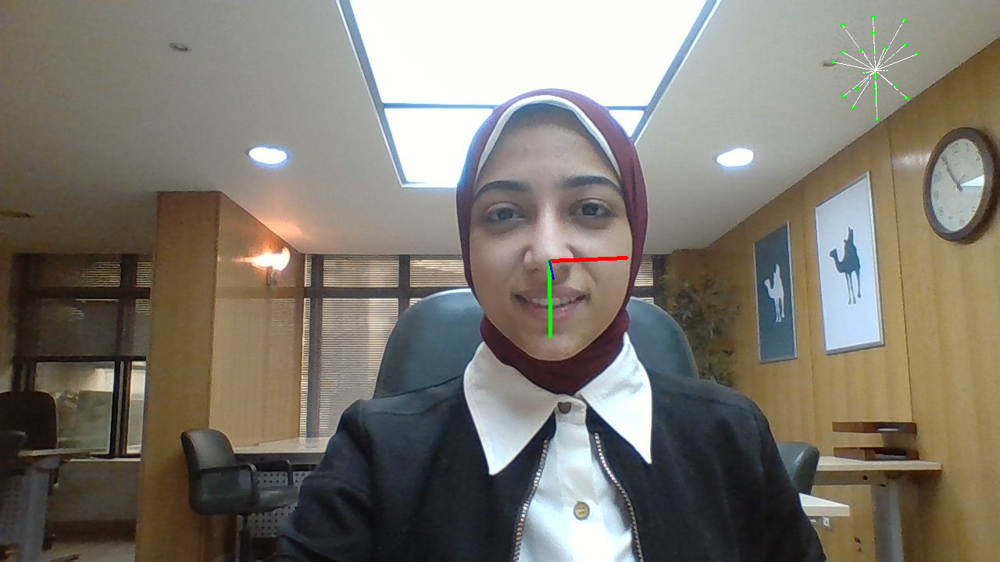

In [36]:
random_file = 'ely'
image = cv2.imread('/content/'+random_file+'.jpg')
image, df = pred(image)
draw_face(image, df, (image.shape[0]//2, image.shape[1]//2), (1.75, .25))
cv2_imshow(image)

## Read from cam

In [40]:
random_file = 'video.mp4'
cap = cv2.VideoCapture('/content/'+random_file)

# Check if camera opened successfully
if (cap.isOpened() == False): 
  print("Unable to read camera feed")
 
# Default resolutions of the frame are obtained.The default resolutions are system dependent.
# We convert the resolutions from float to integer.
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
fps = int(cap.get(5))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out = cv2.VideoWriter('output_alaa_2.mp4', cv2.VideoWriter_fourcc(*'MP4V'), fps, (frame_width,frame_height))
 
while(True):
  ret, frame = cap.read()
 
  if ret == True: 
    updated, df = pred(frame)
    # if result:
    #   updated, df = result
    if type(updated) != type(None):
      draw_face(updated, df, (updated.shape[0]//2, updated.shape[1]//2), (1.75, .35))
      out.write(updated)
    else:
        out.write(frame)
 
    # Press Q on keyboard to stop recording
    if cv2.waitKey(1) & 0xFF == ord('q'):
      break
 
  # Break the loop
  else:
    break 
 
# When everything done, release the video capture and video write objects
cap.release()
out.release()
 
# Closes all the frames
cv2.destroyAllWindows()

In [38]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output_alaa_1.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

**Thank you so much 😊💖**